In [1]:
import os, sys, glob as gb, time, numpy as np

from numpy import *
from tqdm import tqdm
from matplotlib import gridspec
from pandas import DataFrame, read_csv

import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, ListedColormap
import matplotlib.ticker as ticker
plt.rcParams['agg.path.chunksize'] = 20000

from tools21cm import z_to_nu
from tools21cm.irate_file import IonRateFile
from tools21cm.helper_functions import _get_redshifts_in_range, get_interpolated_array
from tools21cm import *

from clump_functions import MergeImages, DeleteEmptyRows, FindNearest, CreateGif, SubgridClumping, OpenBinaryFile, SameValuesInArray, PrintTimeElapsed
from Models_analysis import ModelsParameters

from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
import astropy.constants as cst

In [2]:
plt.rcParams['font.size'] = 30
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True
plt.rcParams['axes.linewidth'] = 1.5
labels_size = 40

In [3]:
work_path = '/home/michele/Documents/PhD_Sussex/output/SubgridClumping/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/'

set_verbose(False)
set_printoptions(precision=3)
set_sim_constants(boxsize_cMpc=500)

os.chdir(work_path)

## create Models file

In [4]:
#xHII = np.array([0.5, 0.7, 0.9])
#xHII = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.99])
#xHII = np.linspace(1., 0, 20, endpoint=False)[::-1]
xHII = np.array([0.99, 0.9, 0.8, 0.7, 0.6, 0.5, 0.4, 0.3, 0.2, 0.1])[::-1]

models = ModelsParameters(xHII, path='./', use_col=3)
models.to_csv('models.csv')
models

For mean ionized fraction (volume):	xHII = [0.1  0.2  0.3  0.4  0.5  0.6  0.7  0.8  0.9  0.99] 



,name,color,style,lw,redshift_to_xHII,redshift_dT_to_xHII,xHII,xHI
mean,BHC,r,-,2,"[11.918, 10.574, 9.533, 8.762, 8.118, 7.617, 7...","[11.918, 9.533, 9.533, 8.118, 8.118, 7.221, 7....","[0.1018, 0.1971, 0.3016, 0.3986, 0.4999, 0.598...","[0.898, 0.803, 0.698, 0.601, 0.5, 0.402, 0.301..."
quadfit,IC,b,--,3.5,"[11.918, 10.574, 9.611, 8.892, 8.34, 7.859, 7....","[11.918, 9.611, 9.611, 8.34, 8.34, 7.48, 7.48,...","[0.1024, 0.2012, 0.3037, 0.4037, 0.4961, 0.600...","[0.898, 0.799, 0.696, 0.596, 0.504, 0.399, 0.2..."
scat,SC,g,-,2,"[11.918, 10.574, 9.611, 8.892, 8.34, 7.859, 7....","[11.918, 9.611, 9.611, 8.34, 8.34, 7.48, 7.48,...","[0.1025, 0.2015, 0.3039, 0.4039, 0.4962, 0.600...","[0.898, 0.798, 0.696, 0.596, 0.504, 0.399, 0.2..."


In [5]:
# TO SAVE THE PhotonCounts2.out IN A TXT FILE
for fit in models.index:
    redshift, nr_lms, nr_lms_suppressable, nr_lms_suppressed, nr_hms, lt = [], [], [], [], [], []
    with open('%s/PhotonCounts2.out' %(work_path+fit)) as f:
        lines = f.readlines()

        i_resume = []
        Ndot_resume = 0
        n = 0

        for i, var in enumerate(lines):
            if('\n' in var):
                line = var.replace('\n', ' ') 

            new_line = np.array(line.split(' '))[:-1]

            if(new_line[0] == ''):
                new_line = new_line[1:]

            try:
                new_line = new_line.astype(float)
                if(n == 0):
                    data_photo2 = new_line[np.newaxis, ...]
                else:
                    data_photo2 = np.vstack((data_photo2, new_line[np.newaxis, ...]))
                n += 1
            except:
                if(i != 0 and i != 1):
                    i_resume.append(n)
                pass

    for j in range(len(i_resume)//2):
        i_prev, i_next = i_resume[2*j]-1, i_resume[2*j+1]
        data_photo2[i_next:,2] = data_photo2[i_prev,2]+data_photo2[i_next:,2]

        np.savetxt('%s/PhotonCounts2_%s.txt' %(work_path+fit, fit), data_photo2, fmt='%.3f\t%.3e\t%.3e\t%.3e\t%.3e', header=' Columns: redshift, total number of ions, grand total ionizing photons, mean ionization fraction (by volume and mass)')
print('...done')

...done


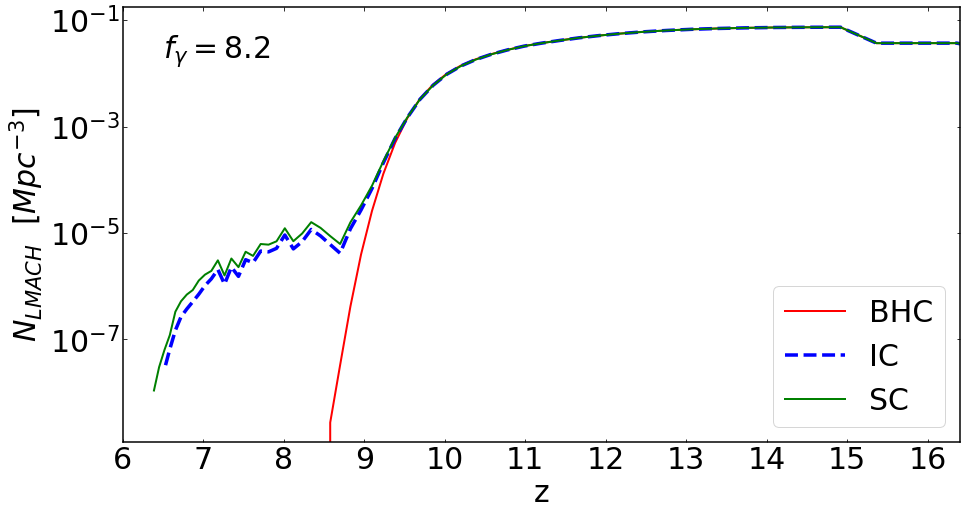

(None, None)

<Figure size 432x288 with 0 Axes>

In [54]:
from myutils.utils import OrderNdimArray, SameValuesInArray

fig = plt.figure(figsize=(15, 8))
#gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1.8])

for fit in models.index:
    redshift, nr_lms, nr_lms_suppressable, nr_lms_suppressed, nr_hms, lt, flux = [], [], [], [], [], [], []
    with open('%s/C2Ray.log' %(work_path+fit)) as f:
        lines = f.readlines()
        for i, line in enumerate(lines):
            if('Doing redshift:' in line):
                line = line.split()                
                try:
                    nr_lms_suppressable.append(int(lines[i+4].split()[-1]))
                    nr_lms_suppressed.append(int(lines[i+5].split()[-1]))
                    nr_hms.append(int(lines[i+6].split()[-1]))
                    nr_lms.append(int(lines[i+8].split()[-1]))
                    lt.append(float(lines[i+9].split()[-2]))
                    flux.append(float(lines[i+10].split()[-2]))
                    redshift.append(round(np.mean([float(line[2]), float(line[4])]), 3))
                except:
                    pass
    
    data = OrderNdimArray(np.vstack((redshift, np.vstack((nr_lms_suppressable, np.vstack((nr_lms_suppressed, np.vstack((nr_hms, flux)))))))), 0).T[::-1,...].T
    #print(data)
    idx = 1
    #ax0 = plt.subplot(gs[0])
    #ax0.semilogy(data[0], data[1] - data[2], color=models.loc[fit, 'color'], linestyle=models.loc[fit, 'style'], label=models.loc[fit, 'name'], lw=models.loc[fit, 'lw'])
    plt.semilogy(data[0], (data[1] - data[2])/((500/0.7)**3), color=models.loc[fit, 'color'], linestyle=models.loc[fit, 'style'], label=models.loc[fit, 'name'], lw=models.loc[fit, 'lw'])
    #plt.semilogy(data[0], (data[3])/((500/0.7)**3), color=models.loc[fit, 'color'], linestyle=models.loc[fit, 'style'], label=models.loc[fit, 'name'], lw=models.loc[fit, 'lw'])
    """
    if(fit == 'mean'):
        red_mean = data[0]
        compare = data[idx]
        ax1 = plt.subplot(gs[1])
    else:
        red_comp = SameValuesInArray(red_mean, data[0])
        idxs = [red in red_mean for red in data[0]]
        print(len(idxs), data[0].size, red_mean)
        print(data[0][idxs].size)
        #np.where(red_comp, data[0])
        #ax1.plot(red_comp)
    """;
    #print(data[0])
plt.text(x=6.5, y=2e-2, s='$f_{\gamma}=8.2$')
plt.legend(loc=4)
plt.xlim(6.2, 16.4)
#, ax1.set_xlim(6.3, 16.4) 
#ax0.set_ylim(9e72, 3e76)
# ax0.set_ylabel('$\dot{N}_{\gamma,\,tot}$  [$Mpc^{-3}$]'), ax1.set_ylabel('difference (%)', size=20)
plt.xlabel('z'), plt.ylabel('$N_{LMACH}$  [$Mpc^{-3}$]')
#plt.subplots_adjust(hspace=.0) 
plt.xticks(np.arange(6, 17, 1.0))
plt.savefig(work_path+'tot_LMACH.png', bbox_inches='tight')
plt.show(), plt.clf()

## Plots Mean Volume Ionized Fraction

In [8]:
#os.chdir(work_path)  # working directory

# Import data as a map with colums as index
data_mean_txt = np.loadtxt('mean/PhotonCounts2_mean.txt', unpack=True)
data_quad_txt = np.loadtxt('quadfit/PhotonCounts2_quadfit.txt', unpack=True)
data_scat_txt = np.loadtxt('scat/PhotonCounts2_scat.txt', unpack=True)

data_mean = DataFrame(data_mean_txt.T, index=data_mean_txt[0] , columns=['z', 'tot_ions', 'tot_Iph', 'xHII_v', 'xHII_m'])
data_quad = DataFrame(data_quad_txt.T, index=data_quad_txt[0] , columns=['z', 'tot_ions', 'tot_Iph', 'xHII_v', 'xHII_m'])
data_scat = DataFrame(data_scat_txt.T, index=data_scat_txt[0] , columns=['z', 'tot_ions', 'tot_Iph', 'xHII_v', 'xHII_m'])

In [9]:
qso_data = np.loadtxt('qso_data.txt', usecols=(0, 1, 2, 3, 4), dtype={'names': ('name', 'z', 'xHI_v', 'up_err', 'low_err'), 'formats': ('S10', np.float, np.float, np.float, np.float)})
print(qso_data)

fan_z1 = 6.1       # Fan et al 2006 (lower limit)
fan_x1 = 4.1e-4
fan_l1 = 3.e-4
fan_z2 = 5.85
fan_x2 = 1.1e-4
fan_l2 = 3.e-5
fan_za = [5.65,5.45,5.25,5.05]
fan_xa = [8.2e-5,6.8e-5,6.8e-5,5.2e-5]
fan_la = [3.2e-5,2.8e-5,2.1e-5,4.e-5]
McGr_z1 = 6.1      # McGreer et al 2011 (upper limit)
McGr_x1 = 0.5
McGr_z2 = 5.9      # McGreer et al 2015 (upper limit)
McGr_x2 = 0.06
McGr_u2 = 0.05
Schr_z1 = 6.2      # Schroeder et al 2013 (lower limit)
Schr_x1 = 0.1
McQu_z1 = 6.3      # McQuinn et al 2008 (upper limit)
McQu_x1 = 0.5
Chor_z1 = 5.91     # Chornock et al 2013 (upper limit)
Chor_x1 = 0.11
Ota_z1 = 7.        # Ota et al 2008
Ota_u1 = 0.26
Ota_l1 = 0.26
Ota_x1 = 0.38
Ouch_z1 = 6.6      # Ouchi et al 2010 (upper limit)
Ouch_x1 = 0.2
Ouch_ul = 0.2
Ouch_z2 = 6.6      # Ouchi et al 2010 (upper limit) clustering
Ouch_x2 = 0.5

[(b'J1342+0928', 7.54 , 0.6 , 0.2 , 0.23)
 (b'J1120+0641', 7.085, 0.48, 0.26, 0.26)]


max dz = 0.300
max delay (quad) and redshift:	0.269	7.480
max delay (scat) and redshift:	0.271	7.480
xHII	dz_q:	dz_s:
0.75	0.062	0.064
0.50	0.203	0.203
0.25	0.253	0.252

max dz = 0.273
max delay (quad) and redshift:	0.236	7.617
max delay (scat) and redshift:	0.238	7.617
xHII	dz_q:	dz_s:
0.75	0.057	0.060
0.50	0.175	0.177
0.25	0.233	0.234



/home/michele/Documents/PhD_Sussex/output/SubgridClumping/clump_functions.py:290: FutureWarning: 
The current behaviour of 'Series.argmin' is deprecated, use 'idxmin'
instead.
The behavior of 'argmin' will be corrected to return the positional
minimum in the future. For now, use 'series.values.argmin' or
'np.argmin(np.array(values))' to get the position of the minimum
row.
  idx = (abs(arr-val)).argmin()


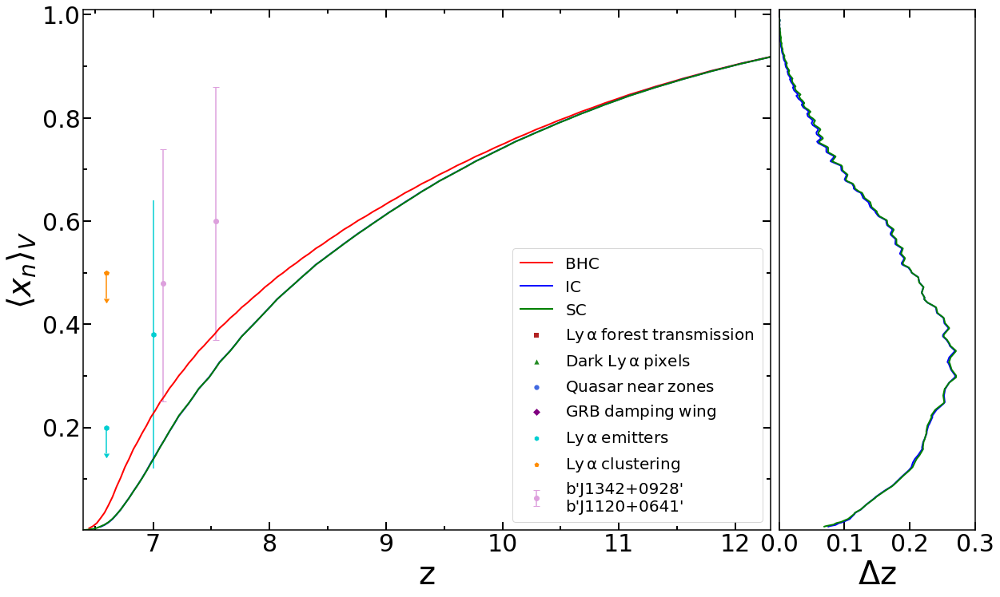

In [10]:
from scipy.interpolate import interp1d
#os.chdir(work_path)  # working directory

# INTERPOLATE VALUES
def InterpolateXi(var):
    f_mean = interp1d(1.-data_mean['xHII_%s' %var], data_mean['z'])
    f_quad = interp1d(1.-data_quad['xHII_%s' %var], data_quad['z'])
    f_scat = interp1d(1.-data_scat['xHII_%s' %var], data_scat['z'])

    #x_new = np.arange(0.006, 1., 0.001)
    x_new = np.arange(0.008, 1., 0.001)

    y_new_mean = f_mean(x_new)
    y_new_quad = f_quad(x_new)
    y_new_scat = f_scat(x_new)

    # delta z
    diff_q = abs(y_new_mean-y_new_quad)
    diff_s = abs(y_new_mean-y_new_scat)
    diff_m = abs(y_new_mean-y_new_mean)
    idx, val = FindNearest(x_new, [0.75, 0.5, 0.25])

    # FIND DELAY MAX AND INDEX IN x_HI
    idx_quad_max, diff_q_max = FindNearest(diff_q, max(diff_q))
    idx_scat_max, diff_s_max = FindNearest(diff_s, max(diff_s))
    print('max dz = %.3f' %(x_new[idx_quad_max]))
    # FIND RELATED REDSHIFT OF THE DELAY MAX
    z_quad_max, idx_quad_max_z = FindNearest(1.-data_quad['xHII_%s' %var], x_new[idx_quad_max])
    z_scat_max, idx_scat_max_z = FindNearest(1.-data_scat['xHII_%s' %var], x_new[idx_scat_max])
    
    print('max delay (quad) and redshift:\t%.3f\t%.3f' %(diff_q_max, z_quad_max))
    print('max delay (scat) and redshift:\t%.3f\t%.3f' %(diff_s_max, z_scat_max))

    exampl_q = [diff_q[a] for a in idx]
    exampl_s = [diff_s[a] for a in idx]
    print("xHII\tdz_q:\tdz_s:\n%.2f\t%.3f\t%.3f\n%.2f\t%.3f\t%.3f\n%.2f\t%.3f\t%.3f\n" %(0.75, exampl_q[0], exampl_s[0], 0.5, exampl_q[1], exampl_s[1], 0.25, exampl_q[2], exampl_s[2]))
    #print diff_q[idx], diff_s[idx]
    return x_new, diff_q, diff_s

fig = plt.figure(figsize=(20, 12))
gs = gridspec.GridSpec(1, 2, width_ratios=[7, 2])
# THE FIRST SUBPLOT
ax0 = plt.subplot(gs[0])
ax0.plot(data_mean['z'], 1.-data_mean['xHII_v'], 'r-', label=models['name'].loc['mean'], lw=2)
ax0.plot(data_quad['z'], 1.-data_quad['xHII_v'], 'b-', label=models['name'].loc['quadfit'], lw=2)
ax0.plot(data_scat['z'], 1.-data_scat['xHII_v'], 'g-', label=models['name'].loc['scat'], lw=2)
#ax0.plot(data_mean['z'], 1.-data_mean['xHII_m'], c='indianred', ls='-', label='GCM', lw=2)
#ax0.plot(data_quad['z'], 1.-data_quad['xHII_m'], c='royalblue', ls='--', label='DCM', lw=3.5)
#ax0.plot(data_scat['z'], 1.-data_scat['xHII_m'], c='greenyellow', ls='-', label='SCM', lw=2)
#for i in range(qso_data.size):
#    print qso_data['z'][i], qso_data['xHI_v'][i], qso_data['low_err'][i], qso_data['up_err'][i]

ax0.errorbar(qso_data['z'], qso_data['xHI_v'], yerr=[[qso_data['low_err'][0], qso_data['low_err'][0]], [qso_data['low_err'][1], qso_data['low_err'][1]]], fmt='o', label='%s\n%s' %(qso_data['name'][0], qso_data['name'][1]), markersize=6, capsize=4, color='plum')       
#ax0.errorbar(fan_z1,fan_x1,yerr=[[fan_l1],[0.05]],lolims=True,marker='s', c='firebrick',mec='firebrick')
#ax0.errorbar(fan_z2,fan_x2,yerr=[[fan_l2],[0.05]],lolims=True,marker='s', c='firebrick',mec='firebrick')
#ax0.errorbar(fan_za,fan_xa,fan_la,marker='s', c='firebrick',mec='firebrick')
ax0.errorbar(McGr_z1,McGr_x1,0.05,uplims=True,marker='^', c='forestgreen',mec='forestgreen')
ax0.errorbar(McGr_z2,McGr_x2,yerr=[[0.05],[McGr_u2]],uplims=True,marker='^', c='forestgreen',mec='forestgreen')
ax0.errorbar(Schr_z1,Schr_x1,0.05,lolims=True,marker='o', c='royalblue',mec='royalblue')
ax0.errorbar(McQu_z1,McQu_x1,0.05,uplims=True,marker='D', c='purple',mec='purple')
ax0.errorbar(Chor_z1,Chor_x1,0.05,uplims=True,marker='D', c='purple',mec='purple')
ax0.errorbar(Ota_z1,Ota_x1,Ota_l1,marker='h', c='darkturquoise',mec='darkturquoise')
ax0.errorbar(Ouch_z1,Ouch_x1,0.05,uplims=True,marker='h', c='darkturquoise',mec='darkturquoise')
ax0.errorbar(Ouch_z2,Ouch_x2,0.05,uplims=True,marker='p', c='darkorange',mec='darkorange')

ax0.scatter(fan_z1,fan_x1,marker='s',c='firebrick',lw=0,s=40,label='$\\rm Ly\,\\alpha\;forest\;transmission$')
ax0.scatter(fan_z2,fan_x2,marker='s',c='firebrick',lw=0,s=40)
ax0.scatter(fan_za,fan_xa,marker='s',c='firebrick',lw=0,s=40)
ax0.scatter(McGr_z1,McGr_x1,marker='^',c='forestgreen',lw=0,s=40,label='$\\rm Dark\;Ly\,\\alpha\;pixels$')
ax0.scatter(McGr_z2,McGr_x2,marker='^',c='forestgreen',lw=0,s=40)
ax0.scatter(Schr_z1,Schr_x1,marker='o',c='royalblue',lw=0,s=40,label='$\\rm Quasar\;near\;zones$')
ax0.scatter(McQu_z1,McQu_x1,marker='D',c='purple',lw=0,s=40,label='$\\rm GRB\;damping\;wing$')
ax0.scatter(Chor_z1,Chor_x1,marker='D',c='purple',lw=0,s=40)
ax0.scatter(Ota_z1,Ota_x1,marker='h',c='darkturquoise',lw=0,s=40,label='$\\rm Ly\,\\alpha\;emitters$')
ax0.scatter(Ouch_z1,Ouch_x1,marker='h',c='darkturquoise',lw=0,s=40)
ax0.scatter(Ouch_z2,Ouch_x2,marker='p',c='darkorange',s=40,lw=0,label='$\\rm Ly\,\\alpha\;clustering$')
ax0.legend(loc=4, borderpad=0.5, prop={'size':20})
ax0.set_xlabel('z', size=labels_size), ax0.set_ylabel(r'$\left< x_n \right>_V$', size=labels_size)
ax0.tick_params(axis='both', length=10, width=2)
#ax0.set_yscale('log')
#ax0.yaxis.set_minor_locator(ticker.MultipleLocator(0.001))
#ax0.yaxis.set_minor_locator(ticker.LogLocator(base=10,numticks=20))
ax0.xaxis.set_minor_locator(ticker.MultipleLocator(0.5))
ax0.tick_params(which='minor', axis='both', length=5, width=2)
ax0.set_xlim(6.4, 12.3)

# THE SECOND SUBPLOT
ax1 = plt.subplot(gs[1], sharey = ax0)
x_new, diff_q, diff_s = InterpolateXi('v')
ax1.plot(diff_q, x_new, 'b-', lw=2)
ax1.plot(diff_s, x_new, 'g-', lw=2)
x_new, diff_q, diff_s = InterpolateXi('m')
#ax1.plot(diff_q, x_new, c='royalblue', ls='--', lw=4)
#ax1.plot(diff_s, x_new, c='greenyellow', ls='-', lw=2)
ax1.set_xlim(0,0.3), ax1.set_ylim(1e-3, 1.01)
ax1.set_xlabel(r'$\Delta$z', size=labels_size)
ax1.tick_params(axis='both', length=10, width=2)
ax1.yaxis.set_minor_locator(ticker.MultipleLocator(0.1))
ax1.xaxis.set_minor_locator(ticker.MultipleLocator(0.5))
ax1.xaxis.set_major_locator(ticker.MultipleLocator(0.1))
ax1.tick_params(which='minor', axis='both', length=5, width=2)
ax1.axes.get_yaxis().set_visible(False)
"""
# THE THIRD SUBPLOT (INSIDE PLOT) 
axin = plt.axes([0.33, 0.18, 0.37, 0.37])
axin.semilogy(data_mean['z'], data_mean['xHII_v'], 'r-', lw=2, label='GCM')
axin.semilogy(data_quad['z'], data_quad['xHII_v'], 'b--', lw=3.5, label='DCM')
axin.semilogy(data_scat['z'], data_scat['xHII_v'], 'g-', lw=2, label='SCM')
axin.tick_params(axis='both', length=5, width=1, labelsize=20)
axin.set_xlim(6, 21.2)
axin.set_ylabel(r'$\left< x_i \right>_V$', size=labels_size)
"""
plt.setp(ax1.get_yticklabels(), visible=False)
yticks = ax0.xaxis.get_major_ticks()  # set list with label
yticks[-1].label1.set_visible(False)  # remove last tick label for the second subplot
plt.subplots_adjust(wspace=0.02)   # remove horizontal gap between subplots
plt.savefig('plot_xi.png', bbox_inches='tight')

## Plots the Mean Volume Photoionization Fraction 

In [9]:
# RUN IT JUST ONE (IT IS LONG!)
path_d = '/its/home/mb756/inputs/sph_smooth_cubepm_130627_12_6912_500Mpc_ext2/global/so/nc300/'
redshift_d = get_dens_redshifts(path_d)

for fit in models.index:
    path_x = '/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C'+fit+'/results/'
    redshift = get_xfrac_redshifts(path_x)
    
    data = np.zeros((len(redshift), 4))
    for i in tqdm(range(len(redshift))):
        z = redshift[i]
        data[i,0] = z
        irate = IonRateFile('%sIonRates3_%.3f.bin' %(path_x, z)).irate

        idx, z = FindNearest(redshift_d, z)
        ndens = DensityFile('%s%.3fn_all.dat' %(path_d, z)).raw_density
        ndens = ndens/np.mean(ndens) - 1.
        
        irate_u = np.mean(irate[ndens < 0])
        irate_o = np.mean(irate[ndens > 0])

        data[i,1] = np.mean(irate)
        data[i,2] = irate_u
        data[i,3] = irate_o 
    np.savetxt('%s/MeanIonRate_C%s.txt' %(work_path+fit, fit), data, delimiter='\t', fmt='%.4e', header='Redshift, mean ionizing rate in all density range, underdensity (<0) and overdensity region (>0)\nz\t\tIonRates [s^-1]')

100%|██████████| 126/126 [04:38<00:00,  2.17s/it]


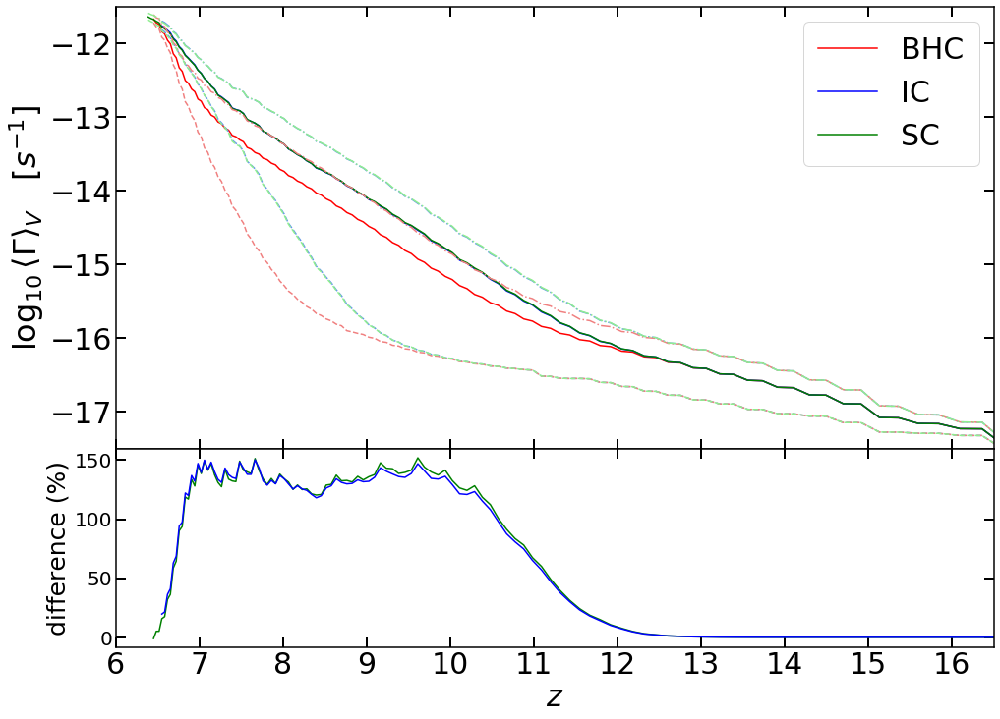

In [53]:
from matplotlib import gridspec
os.chdir(work_path)  # working directory

z_mean, Irate_m_mean, Irate_m_under, Irate_m_over = np.loadtxt('mean/MeanIonRate_Cmean.txt', unpack=True)
z_quad, Irate_q_mean, Irate_q_under, Irate_q_over = np.loadtxt('quadfit/MeanIonRate_Cquadfit.txt', unpack=True)
z_scat, Irate_s_mean, Irate_s_under, Irate_s_over = np.loadtxt('scat/MeanIonRate_Cscat.txt', unpack=True)

diff_q_Irate = 100*(Irate_q_mean - Irate_m_mean[3:])/Irate_m_mean[3:]   # raw comparison
diff_s_Irate = 100*(Irate_s_mean[2:] - Irate_m_mean)/Irate_m_mean   # raw comparison
diff_q_Irate_under = 100*(Irate_q_under - Irate_m_under[3:])/Irate_m_under[3:]   # raw comparison
diff_s_Irate_under = 100*(Irate_s_under[2:] - Irate_m_under)/Irate_m_under   # raw comparison
diff_q_Irate_over = 100*(Irate_q_over - Irate_m_over[3:])/Irate_m_over[3:]   # raw comparison
diff_s_Irate_over = 100*(Irate_s_over[2:] - Irate_m_over)/Irate_m_over   # raw comparison


# PLOTS
fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1.8]) # set height ratios for sublots
# THE FIRST SUBPLOT
ax0 = plt.subplot(gs[0])
ax0.plot(z_mean, log10(Irate_m_mean), 'r-', label='BHC', lw=1.5)
ax0.plot(z_quad, log10(Irate_q_mean), 'b-', label='IC', lw=1.5)
ax0.plot(z_scat, log10(Irate_s_mean), 'g-', label='SC', lw=1.5)
ax0.plot(z_quad, log10(Irate_q_under), color='cornflowerblue', ls='--', lw=1.5)
ax0.plot(z_quad, log10(Irate_q_over), color='cornflowerblue', ls='-.', lw=1.5)
ax0.plot(z_mean, log10(Irate_m_under), color='lightcoral', ls='--', lw=1.5)
ax0.plot(z_mean, log10(Irate_m_over), color='lightcoral', ls='-.', lw=1.5)
ax0.plot(z_scat, log10(Irate_s_under), color='lightgreen', ls='--', lw=1.5)
ax0.plot(z_scat, log10(Irate_s_over), color='lightgreen', ls='-.', lw=1.5)
#ax0.fill_between(z_quad, log10(Irate_q_under), log10(Irate_q_over), color='cornflowerblue', alpha=0.1)
#ax0.fill_between(z_scat, log10(Irate_s_under), log10(Irate_s_over), color='lightgreen', alpha=0.1)
#ax0.fill_between(z_mean, log10(Irate_m_under), log10(Irate_m_over), color='lightcoral', alpha=0.1)
ax0.legend(loc=1, borderpad=0.5)
ax0.tick_params(axis='both', length=10, width=2)
ax0.tick_params(which='minor', axis='both', top=True, length=6, width=2)
ax0.set_ylim(-17.5, -11.5)
#ax0.set_ylim(3e-18, 3e-12)
ax0.set_ylabel(r'log$_{10}\,\left< \Gamma \right>_V$   $[s^{-1}]$', size=labels_size-8)
# THE SECOND SUBPLOT
ax1 = plt.subplot(gs[1], sharex = ax0)
ax1.plot(z_mean, diff_s_Irate, 'g-', lw=1.5)
ax1.plot(z_mean[3:], diff_q_Irate, 'b-', lw=1.5)
#ax1.plot(z_mean[3:], diff_q_Irate_under, 'b--', lw=2)
#ax1.plot(z_mean[3:], diff_q_Irate_over, 'b-.', lw=2)
#ax1.plot(z_mean, diff_s_Irate_under, 'g--', lw=2)
#ax1.plot(z_mean, diff_s_Irate_over, 'g-.', lw=2)
#ax1.fill_between(z_mean[3:], diff_q_Irate_under, diff_q_Irate_over, color='cornflowerblue', alpha=0.1)
#ax1.fill_between(z_mean, diff_s_Irate_under, diff_s_Irate_over, color='lightgreen', alpha=0.1)
ax1.tick_params(axis='both', length=10, width=2), ax1.tick_params(axis='y', labelsize=20)
ax1.set_xlim(6.3, 16.5)
ax1.set_ylabel('difference (%)', size=labels_size-15)
ax1.set_xlabel('$z$', size=labels_size-10)
# PLOT SETUP
plt.setp(ax0.get_xticklabels(), visible=False) # remove x label from fist plot
#ax1.set_yscale('log')
#ax1.set_ylim(1, 1e3)
#plt.yticks[0].label1.set_visible(False)
ax0.set_xticks(np.arange(6, 17, 1.0))
ax1.set_xticks(np.arange(6, 17, 1.0))

plt.subplots_adjust(hspace=.0)   # remove vertical gap between subplots
plt.savefig('plot_IonRate.png', bbox_inches='tight')

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3] 



/home/michele/python/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:17: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home/michele/python/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:19: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


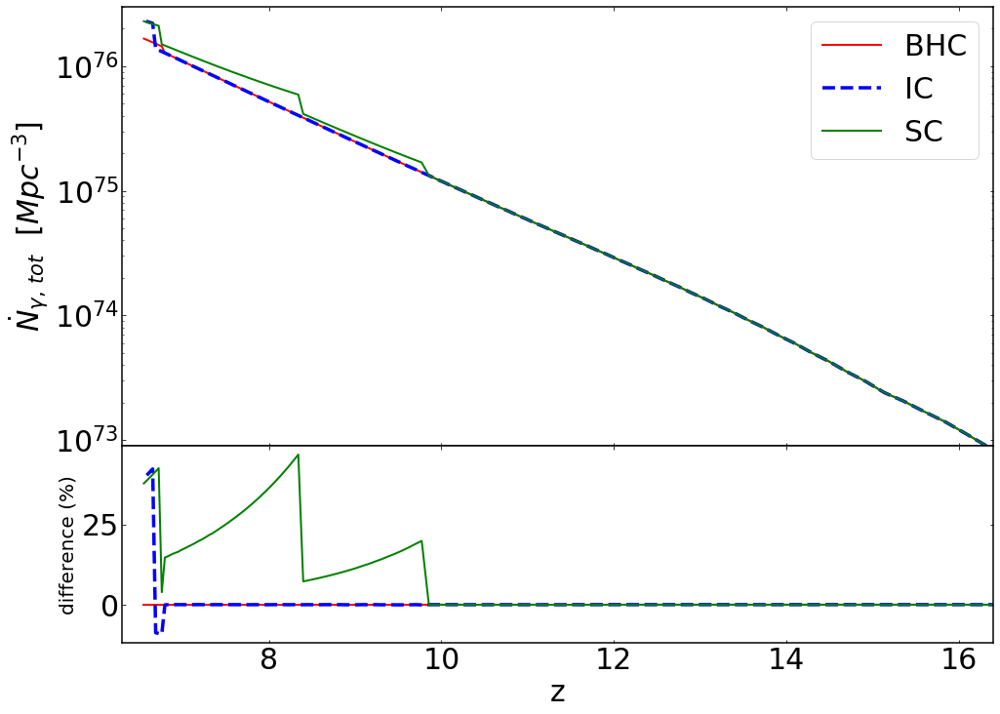

(None, None)

<Figure size 432x288 with 0 Axes>

In [265]:
import pandas as pd
from matplotlib import gridspec

redshift_mean, Ndot_mean = np.loadtxt('%smean/PhotonCounts2_mean.txt' %(work_path), usecols=(0, 2), unpack=True)

models = ModelsParameters()

fig = plt.figure(figsize=(16, 12))
gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1.8])
for fit in models.index:

    redshift, Ndot = np.loadtxt('%s/PhotonCounts2_%s.txt' %(work_path+fit, fit), usecols=(0, 2), unpack=True)
    diff_Ndot = 100*((Ndot-Ndot_mean)/Ndot_mean)
    for i in range(Ndot.size):
        if(i != 0 and i != 1 and np.log10(Ndot[i])-np.log10(Ndot[i-1]) >= 1):
            print(redshift[i])
    ax0 = plt.subplot(gs[0])
    ax0.semilogy(redshift, Ndot, color=models.loc[fit, 'color'], label=models.loc[fit, 'name'], linestyle=models.loc[fit, 'style'], lw=models.loc[fit, 'lw'])
    ax1 = plt.subplot(gs[1])
    ax1.plot(redshift, diff_Ndot, color=models.loc[fit, 'color'], label=models.loc[fit, 'name'], linestyle=models.loc[fit, 'style'], lw=models.loc[fit, 'lw'])
ax0.legend()
ax0.set_xlim(6.3, 16.4), ax1.set_xlim(6.3, 16.4) 
ax0.set_ylim(9e72, 3e76)
plt.xlabel('z'), ax0.set_ylabel('$\dot{N}_{\gamma,\,tot}$  [$Mpc^{-3}$]'), ax1.set_ylabel('difference (%)', size=20)
plt.subplots_adjust(hspace=.0) 
plt.savefig(work_path+'tot_ionphot.png', bbox_inches='tight')
plt.show(), plt.clf()

## Plots Box Slice
by defining 'datatype' you can create box slice plot for different quantity (xfrac, recomb, density, cbin, temp, irate, etc.). You can specify if embend a zoom-in slice plot by turning on/off the variable 'zoom' 

In [28]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from matplotlib.colors import LogNorm

plt.rcParams['figure.max_open_warning'] = 0
plt.rcParams['font.size'] = 1
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.direction'] = 'out'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True
plt.rcParams['axes.linewidth'] = 3

set_sim_constants(boxsize_cMpc=500)

def BoxQuantity(LBox, z):
    dthet = (((LBox*u.Mpc/cosmo.h)/((1+z)*cosmo.angular_diameter_distance(z)))*u.rad).to(u.arcmin)
    dnu = (1.42*u.GHz*cosmo.H(z)*(LBox*u.Mpc/cosmo.h)/(cst.c*(1+z)**2)).to(u.MHz)
    return dthet, dnu

import astropy.units as u
import astropy.constants as cst
from astropy.cosmology import FlatLambdaCDM

cosmo = FlatLambdaCDM(H0=H0, Om0=Omega0, Ob0=OmegaB)
alphB = (2.59e-13*u.cm**3/u.s).cgs
V_RTcell = ((500./(0.7*300.**3))*u.Mpc**3).cgs
rho_matter = cosmo.critical_density0.cgs * cosmo.Om0
eta_He = 0.074
mu_H = 1.+4*eta_He/(1-eta_He)

#redshift = [30., 20.134, 15.596, 11.791, 9.611, 8.283, 7.48, 6.905, 6.549]
models = ModelsParameters([0.5, 0.7, 0.9])
datatype = 'recomb'
zoom = True
my_ext = (0, 500, 0, 500)
"""
z_m = np.load('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/mean/lightcone/Zlightcone_dTb_B2km_Cmean.dat')
z_q = np.load('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/quadfit/lightcone/Zlightcone_dTb_B2km_Cquadfit.dat')
z_s = np.load('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/scat/lightcone/Zlightcone_dTb_B2km_Cscat.dat')

redshift = np.sort(np.array(list(set(redshift_xf).intersection(redshift_d))))
"""

for fit in models.index:
    save_path = work_path+fit+'/imagesHII/'
    
    if(datatype == 'xfrac'):
        redshift = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)
    elif('temp' in datatype):
        if('_B' in datatype):
                redshift = np.loadtxt('%s/21cm/dTb_data%s/redshift.txt' %(work_path+fit, datatype[datatype.find('_B'):]))
        else:
            redshift = np.loadtxt('%s/21cm/dTb_data/redshift.txt' %(work_path+fit))
    else:
        redshift = models.loc[fit, 'redshift_to_xHII'][::-1]

    print 'Making plotslice with zoom-in for model:', fit
    
    for i in tqdm(range(len(redshift))):
        z = redshift[i]
        fig, ax = plt.subplots(figsize=(20,20))
        figsize_x, figsize_y = fig.get_size_inches()*fig.dpi
        
        if(datatype == 'xfrac'):
            # for xfrac
            os.chdir('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)
            plot_data, datatype = get_data_and_type('xfrac3d_%.3f.bin' %z)
            clim_max = 1
            color = 'jet'
            label_cbar = r'$x_i$'
        elif(datatype == 'irate'):
            # for irate
            os.chdir('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)
            plot_data = IonRateFile('IonRates3_%.3f.bin' %z).irate
            clim_max = 3e-12
            color = 'Oranges'
            label_cbar = r'$\left<\Gamma_{ion}\right>_{cell}$   $[10^{-11}\,\, s^{-1}]$'
        elif(datatype == 'density'):
            # for density
            os.chdir('/its/home/mb756/inputs/sph_smooth_cubepm_130627_12_6912_500Mpc_ext2/global/so/nc300')
            #os.chdir('/research/prace/sph_smooth_cubepm_130314_6_1728_6.3Mpc_ext2/nc1200')
            idx, z = FindNearest(get_dens_redshifts('./'), z)
            plot_data, datatype = get_data_and_type('%.3fn_all.dat' %z, raw_density=True)
            plot_data /= np.mean(plot_data)
            clim_max = 2*np.mean(plot_data)
            color = 'PRGn'
            #color = 'Purples'
            label_cbar = r'$1+\delta$'
        elif('temp' in datatype):
            # for density
            if('_B' in datatype):
                os.chdir('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/%s/21cm/dTb_data_B2km/' %fit)
                filename = 'dTb_cbin_z%.3f%s.dat' %(z, datatype[datatype.find('_B'):])
            else:
                os.chdir('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/%s/21cm/dTb_data/' %fit)
                filename = 'dTb_cbin_z%.3f.dat' %z
            plot_data = read_cbin(filename)
            clim_max = 40.
            color = 'plasma'
            label_cbar = r'$\delta T_b\,\,[mK]$'
        elif(datatype=='recomb'):
            # for recomb
            os.chdir('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)
            xHII = XfracFile('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results/xfrac3d_%.3f.bin' %(fit, z)).xi
            if(fit == 'mean'):
                par = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/res1.667_mean.txt' %fit, usecols=(0,1,2))
                C = SubgridClumping(z, *par)
            else:
                idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), z)
                C = 10**read_cbin('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/z%.3f_res1.667_%s.dat' %(fit, z, fit))

            idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), z)
            n_all = DensityFile('/its/home/mb756/inputs/sph_smooth_cubepm_130627_12_6912_500Mpc_ext2/global/so/nc300/%.3fn_all.dat' %z).cgs_density
            nH = n_all*u.g/(u.cm**3)/cst.m_p.cgs

            Rcell = 1.08*alphB*V_RTcell*(1+z)**3 * C * (xHII*nH)**2           
            plot_data = ((2./3.)*Rcell*Omega0*mu_H*cst.m_p.cgs/(cosmo.H(z)*V_RTcell*rho_matter*OmegaB)).cgs # <N_rec>_cell
            clim_max = 2*65.

            color = 'Greens'
            label_cbar = r'$\left<N_{rec}\right>_{cell}$'
        elif(datatype == 'cbin'):
            # for clumping files
            os.chdir('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s' %fit)
            idx, z = FindNearest(np.loadtxt('../z_500Mpc_nc300.txt'), z)
            if(fit == 'mean'):
                par = np.loadtxt('res1.667_mean.txt', usecols=(0,1,2))
                plot_data = SubgridClumping(z, *par) * np.ones((300,300,300))
            else:
                plot_data = 10**read_cbin('z%.3f_res1.667_%s.dat' %(z, fit))
            datatype = 'cbin'
            clim_max = 2*SubgridClumping(z, *par)
            color = 'BrBG'
        
        # Main Plot
        im = ax.imshow(plot_data[:,150,:], extent=my_ext, cmap=color) #BrBG, PRGn, jet
        im.set_clim(0, clim_max)

        ax.tick_params(axis='both', direction='in', length=15, width=3, labelsize=0)
        #ax.set_title('z = %.3f' %z, size=40)
        nu = z_to_nu(z)
        dth, dnu = BoxQuantity(500./300, z)
        #ax.set_title('z = %.3f\n 'r'$\Delta\theta_{res}$ = %.3f arcmin''\t'r' $\nu_{obs}$ = %.2f $\pm$ %.2f MHz' %(z, dth.value, nu, dnu.value/2) , size=26)
        #ax.set_xlabel('$\mathrm{cMpc/h}$'), ax.set_ylabel('$\mathrm{cMpc/h}$')
        #ax.set_title('$\mathrm{cMpc/h}$', size=16)
        
        # show COLORBAR
        #cbar = fig.colorbar(im, cax=fig.add_axes([0.92, 0.15, 0.03, 0.7]))
        #cbar.set_label(label_cbar, size=35)
        #cbar.ax.tick_params(labelsize=22) 
        
        if(zoom):
            # Zoom-in Plot
            axins = zoomed_inset_axes(ax, 3.5, loc=2, bbox_to_anchor=(int(figsize_x*0.53), int(figsize_y*0.48)))
            imins = axins.imshow(plot_data[:,150,:], extent=my_ext, cmap=color)
            imins.set_clim(0, clim_max)
            
            x1, x2, y1, y2 = 180, 240, 310, 370
            axins.set_xlim(x1, x2)
            axins.set_ylim(y1, y2)
            [axins.spines[axis].set_linewidth(7) for axis in ['top','bottom','left','right']]
            axins.tick_params(axis='both', direction='in', top=True, right=True, length=15, width=5, labelsize=0)
            mark_inset(ax, axins, loc1=3, loc2=1, ec='black', lw=5)


        plt.savefig('%splotSlice_500Mpc_z%.3f_zoom_%s_%s.png' %(save_path, z, fit, datatype), bbox_inches='tight');
        plt.clf()
    print '...done plotslice.\n'

For mean ionized fraction (volume):	xHII = [0.5 0.7 0.9] 



  0%|          | 0/3 [00:00<?, ?it/s]

Making plotslice with zoom-in for model: mean


  0%|          | 0/3 [00:00<?, ?it/s]

...done plotslice.

Making plotslice with zoom-in for model: quadfit


  0%|          | 0/3 [00:00<?, ?it/s]

...done plotslice.

Making plotslice with zoom-in for model: scat


100%|██████████| 3/3 [00:25<00:00,  8.64s/it]

...done plotslice.



<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [46]:
z_m = read_raw_binary('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/mean/lightcone/Zlightcone_dTb_B2km_Cmean.dat')
z_q = read_raw_binary('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/quadfit/lightcone/Zlightcone_dTb_B2km_Cquadfit.dat')
z_s = read_raw_binary('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/scat/lightcone/Zlightcone_dTb_B2km_Cscat.dat')

print max(max(z_m), max(z_q), max(z_s)) ,  min(min(z_m), min(z_q), min(z_s))


21.05586019526353 6.418


In [19]:
# Create movie
os.chdir(work_path)

fit = 'scat'

redshift = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)[::-1]
arr_images_zoom = np.array(['%s/imagesHII/plotSlice_500Mpc_z%.3f_zoom_scat_xfrac.png' %(fit, val_z) for val_z in redshift])

CreateGif('movieIonFrac_C%s_zoom' %fit, arr_images_zoom, scale=1., fps=5, fmt='avi')

[MoviePy] >>>> Building video movieIonFrac_Cscat_zoom.avi
[MoviePy] Writing video movieIonFrac_Cscat_zoom.avi


100%|██████████| 126/126 [00:22<00:00,  7.30it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: movieIonFrac_Cscat_zoom.avi 



32M	movieIonFrac_Cscat_zoom.avi



<moviepy.video.io.ImageSequenceClip.ImageSequenceClip instance at 0x2aacbe77d050>

In [29]:
# Merge images togheter for Article
os.chdir(work_path)

models = ModelsParameters([0.5, 0.7, 0.9])
datatype = 'recomb'
arr_images_zoom = []

#redshift_sample = [30., 20.134, 15.596, 11.791, 9.611, 8.283, 7.48, 6.905, 6.549]
#arr_images_zoom = np.array(['%s/imagesHII/plotSlice_500Mpc_z%.3f_zoom_%s.png' %(fit, val_z, fit) for val_z in redshift_sample for fit in models.index])

print 'Making Merged Images with Zoom...'
for fit in models.index:
    redshift_sample = models.loc[fit, 'redshift_to_xHII']

    for val_z in redshift_sample:
        if(datatype == 'density' or datatype == 'recomb'):
            idx, val_z = FindNearest(get_dens_redshifts('/its/home/mb756/inputs/sph_smooth_cubepm_130627_12_6912_500Mpc_ext2/global/so/nc300'), val_z)
        elif(datatype == 'cbin'):
            idx, val_z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), val_z)
        else:
            pass
        
        arr_images_zoom = np.append(arr_images_zoom, '%s/imagesHII/plotSlice_500Mpc_z%.3f_zoom_%s_%s.png' %(fit, val_z, fit, datatype))

MergeImages('slice_comparison_with_zoom_same_xi_%s' %datatype, arr_images_zoom, form=(3,3))
print '...done.'

For mean ionized fraction (volume):	xHII = [0.5 0.7 0.9] 

Making Merged Images with Zoom...
...done.


In [10]:
# Merge images togheter and create movie for Presentation
os.chdir(work_path)

datatype = 'temp_B2km'
arr_images_zoom = []

#redshift_sample = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_Cquadfit/results')[::-1]
redshift_sample = np.loadtxt('quadfit/21cm/dTb_data/redshift.txt')[::-1]

for i in tqdm(range(len(redshift_sample))):
    val_z = redshift_sample[i]
    arr_merge_im = ['mean/imagesHII/plotSlice_500Mpc_z%.3f_zoom_mean_%s.png' %(val_z, datatype), 'quadfit/imagesHII/plotSlice_500Mpc_z%.3f_zoom_quadfit_%s.png' %(val_z, datatype), 'scat/imagesHII/plotSlice_500Mpc_z%.3f_zoom_scat_%s.png' %(val_z, datatype)]
    MergeImages('plot_to_merge%d' %i, arr_merge_im, form='h')
CreateGif('coolmovie_compare_slice_zoom_%s' %datatype, 'plot_to_merge', scale=1., fps=5, fmt='avi')
os.system('rm plot_to_merge*.png')


100%|██████████| 61/61 [00:27<00:00,  2.37it/s]


[MoviePy] >>>> Building video coolmovie_compare_slice_zoom_temp_B2km.avi
[MoviePy] Writing video coolmovie_compare_slice_zoom_temp_B2km.avi


100%|██████████| 61/61 [00:20<00:00,  3.05it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: coolmovie_compare_slice_zoom_temp_B2km.avi 



32M	coolmovie_compare_slice_zoom_temp_B2km.avi



0

In [5]:
# Merge images togheter and create movie for Presentation 2
os.chdir(work_path)

models = ModelsParameters()
datatype = 'xfrac'
arr_images_zoom = []

redshift_sample = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_Cquadfit/results')[::-1]

for fit in models.index:
    os.chdir(work_path+fit+'/imagesHII/')

    for i in tqdm(range(len(redshift_sample))):
        val_z = redshift_sample[i]
        idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), val_z)

        arr_merge_im = ['plotSlice_500Mpc_z%.3f_zoom_%s_xfrac.png' %(val_z, fit), 'plotSlice_500Mpc_z%.3f_zoom_%s_recomb.png' %(z, fit), 'plotSlice_500Mpc_z%.3f_zoom_%s_irate.png' %(val_z, fit)]
        MergeImages('plot_to_merge%d' %i, arr_merge_im, form='h')
    CreateGif('../../coolmovie_compare_slice_xi+R+N_zoom_%s' %fit, 'plot_to_merge', scale=1., fps=8, fmt='avi')
    os.system('rm plot_to_merge*.png')


  0%|          | 0/121 [00:00<?, ?it/s]

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3]


100%|██████████| 121/121 [01:18<00:00,  1.52it/s]


[MoviePy] >>>> Building video ../../coolmovie_compare_slice_xi+R+N_zoom_mean.avi
[MoviePy] Writing video ../../coolmovie_compare_slice_xi+R+N_zoom_mean.avi


 74%|███████▍  | 90/122 [00:37<00:13,  2.37it/s]

KeyboardInterrupt: 

In [9]:
# Merge images togheter and create movie for Presentation 3
os.chdir(work_path)

models = ModelsParameters()
datatype = 'xfrac'
arr_images_zoom = []

redshift_sample = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_Cquadfit/results')[::-1]


for i in tqdm(range(len(redshift_sample))):
    val_z = redshift_sample[i]
    idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), val_z)

    arr_merge_im1 = ['mean/imagesHII/plotSlice_500Mpc_z%.3f_zoom_mean_xfrac.png' %val_z, 'mean/imagesHII/plotSlice_500Mpc_z%.3f_zoom_mean_recomb.png' %z, 'mean/imagesHII/plotSlice_500Mpc_z%.3f_zoom_mean_irate.png' %val_z]
    arr_merge_im2 = ['quadfit/imagesHII/plotSlice_500Mpc_z%.3f_zoom_quadfit_xfrac.png' %val_z, 'quadfit/imagesHII/plotSlice_500Mpc_z%.3f_zoom_quadfit_recomb.png' %z, 'quadfit/imagesHII/plotSlice_500Mpc_z%.3f_zoom_quadfit_irate.png' %val_z]
    arr_merge_im3 = ['scat/imagesHII/plotSlice_500Mpc_z%.3f_zoom_scat_xfrac.png' %val_z, 'scat/imagesHII/plotSlice_500Mpc_z%.3f_zoom_scat_recomb.png' %z, 'scat/imagesHII/plotSlice_500Mpc_z%.3f_zoom_scat_irate.png' %val_z]
    #arr_tot = np.hstack((np.hstack((arr_merge_im1, arr_merge_im2))
    arr_tot = np.hstack((arr_merge_im1, arr_merge_im3))

    MergeImages('plot_to_merge%d' %i, arr_tot, form=(2,3), delete_old=False)
    
CreateGif('coolmovie_compare_slice_xi+R+N_zoom_ms', 'plot_to_merge', scale=1., fps=8, fmt='avi')
os.system('rm plot_to_merge*.png')


  0%|          | 0/121 [00:00<?, ?it/s]

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3]


100%|██████████| 121/121 [01:56<00:00,  1.02it/s]


[MoviePy] >>>> Building video coolmovie_compare_slice_xi+R+N_zoom_ms.avi
[MoviePy] Writing video coolmovie_compare_slice_xi+R+N_zoom_ms.avi


 99%|█████████▉| 121/122 [01:19<00:00,  1.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: coolmovie_compare_slice_xi+R+N_zoom_ms.avi 

128M	coolmovie_compare_slice_xi+R+N_zoom_ms.avi



0

## Plots Slice of the $\delta T_b$

In [5]:
set_verbose(False)
plt.rcParams['figure.figsize'] = 10, 8 

models = ['scat']#, 'quadfit', 'mean']
for fit in models:
    os.chdir('/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/%s/21cm/dTb_data' %fit)  # working directory
    save_path = work_path

    redshift = loadtxt('redshift.txt')
    print redshift
    print 'Making plotslice from dTb_cbin files for model:', fit
    for i in tqdm(range(len(redshift))):
        z = redshift[i]
        lamb = nu_t
        plt.title('z = %.3f' %z)
        plot_slice('dTb_cbin_z%.3f.dat' %z, slice_num=150)
        plt.clim(0., 80.)
        plt.savefig(save_path+'plotSlice_500Mpc_z%.3f.png' %z, bbox_inches='tight')
        plt.clf()
    print '...done plotslice.\n'

    print 'Making .gif from Lightcone files...'
    #os.chdir(work_path)
    arr_images = gb.glob(save_path+'plotSlice_500Mpc*.png')[::-1]
    CreateGif('moviedTb_C'+fit, arr_images, fps=5)
    print '...done gif.\n'
print '...done.'

  0%|          | 0/63 [00:00<?, ?it/s]

[21.062 20.134 19.298 18.54  17.848 17.215 16.633 16.095 15.596 15.132
 14.699 14.294 13.914 13.557 13.221 12.903 12.603 12.318 12.048 11.791
 11.546 11.313 11.09  10.877 10.673 10.478 10.29  10.11   9.938  9.771
  9.611  9.457  9.308  9.164  9.026  8.892  8.762  8.636  8.515  8.397
  8.283  8.172  8.064  7.96   7.859  7.76   7.664  7.57   7.48   7.391
  7.305  7.221  7.139  7.059  6.981  6.905  6.83   6.757  6.686  6.617
  6.549  6.483  6.418]
Making plotslice from dTb_cbin files for model: scat


Exception KeyError: KeyError(<weakref at 0x2aab0b5dfec0; to 'tqdm' at 0x2aaad49bc090>,) in <bound method tqdm.__del__ of   0%|          | 0/63 [00:00<?, ?it/s]> ignored


NameError: name 'nu_t' is not defined

In [3]:
print '--------------- Plots Cool Movie dTb -------------'

my_ext_S = [0, 500, 0, 500]     # Mpc/h axis
#my_ext_S = [0, ..., 0, ...]     # angular axis
#my_ext_L = [redshift[0], redshift[-1], 0, 500]                      # redshift axis
my_ext_L = [z_to_nu(redshift[0]), z_to_nu(redshift[-1]), 0, 500]     # freq axis

for i in tqdm(range(redshift.size)):
    z = redshift[i]
    nu = z_to_nu(z)
    '--- Plot Slice ---'
    fig = plt.figure(1, figsize=(7, 7))
    plt.imshow(lightcone[:,:,i], cmap='viridis', extent=my_ext_S, aspect='auto')     # or cmap='jet' for blue to red
    plt.clim(0., 75.)
    plt.title(r'z = %.3f   $\nu_{obs}$ = %.1f MHz' %(z, nu), size=16)
    plt.xlabel('$Mpc/h$', size=14), plt.ylabel('$Mpc/h$', size=14)
    cbar = plt.colorbar(cax=fig.add_axes([0.93, 0.1, 0.03, 0.8]))
    cbar.set_label('$\delta T_b$', size=14)
    plt.savefig('%s/21cm/dTb_data/plot_S%d_CoolMovie.png' %(fit, i), bbox_inches='tight')
    plt.clf()

'--- Plot Lightcone ---'
fig = plt.figure(2, figsize=(16, 5))
plt.imshow(lightcone[:,150,:], cmap='viridis', extent=my_ext_L, aspect='auto')     # or cmap='jet' for blue to red
plt.axvline(x=nu, color='lightgrey', linewidth=3)
plt.clim(0., 75.)
plt.xlabel(r'$\nu_{obs}$ [MHz]', size=14), plt.ylabel('$Mpc/h$', size=14)
cbar = plt.colorbar(cax=fig.add_axes([0.91, 0.1, 0.03, 0.8]))
cbar.set_label('$\delta T_b$', size=14)
plt.savefig('%s/21cm/dTb_data/plot_L%d_CoolMovie.png' %(fit, i), bbox_inches='tight')
plt.clf()

--------------- Plots Cool Movie dTb -------------


NameError: name 'redshift' is not defined

In [ ]:
arr_images = [fit+'/21cm/dTb_data/plotSlice'+str(i)+'_CoolMovie.png' for i in range(redshift.size)][::-1]
#gb.glob('%s/CoolMovie/plot_L%d_CoolMovie.png' %fit)[::-1]
CreateGif('movieIonFrac_C'+Cmodel, arr_images, fps=10)

## Plot Past Lightcone $x_i$

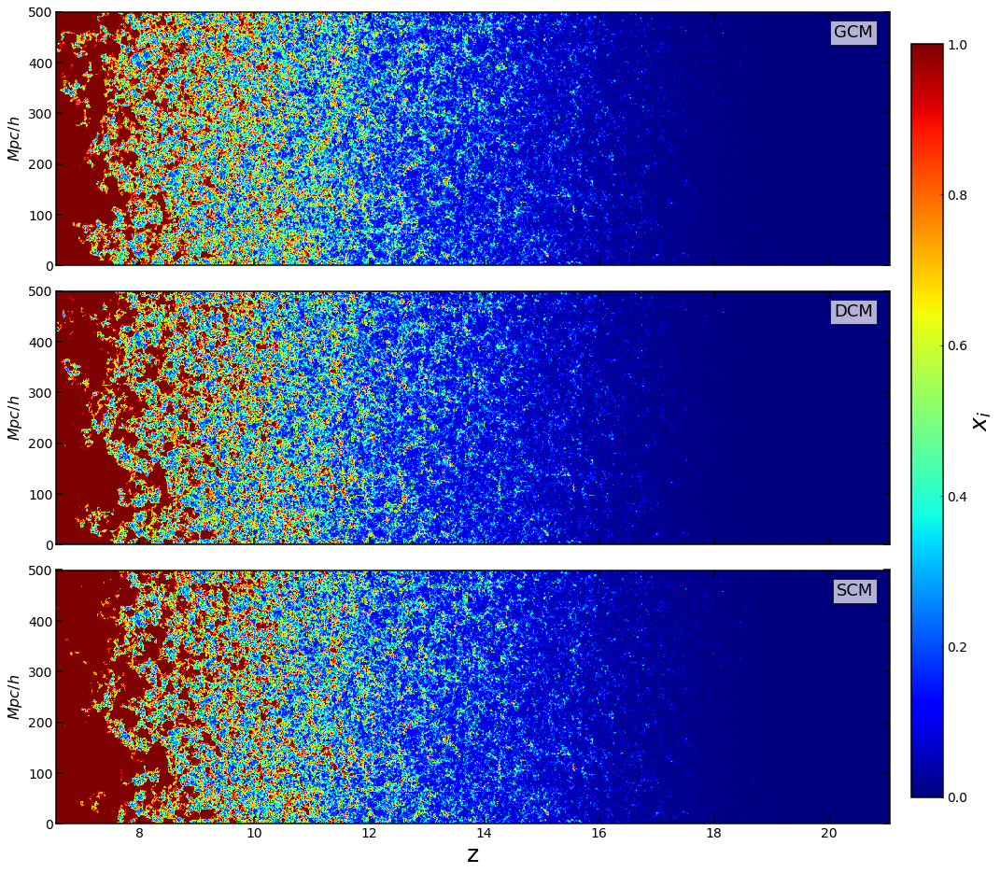

<Figure size 432x288 with 0 Axes>

In [20]:
plt.rcParams['font.size'] = 14

os.chdir(work_path)

lightcone_mean = read_cbin('mean/lightcone/dataLightcone_Cmean.dat')
z_mean = read_raw_binary('mean/lightcone/Zlightcone_Cmean.dat')

lightcone_quad = read_cbin('quadfit/lightcone/dataLightcone_Cquadfit.dat')
z_quad = read_raw_binary('quadfit/lightcone/Zlightcone_Cquadfit.dat')

lightcone_scat = read_cbin('scat/lightcone/dataLightcone_Cscat.dat')
z_scat = read_raw_binary('scat/lightcone/Zlightcone_Cscat.dat')


#my_ext = [z_to_nu(z_quad[0]), z_to_nu(z_quad[-1]), 0, 500*0.015623254745001935] # angular axis
my_ext = [z_quad[0], z_quad[-1], 0, 500]                      # redshift axis
#my_ext = [z_to_nu(z_quad[0]), z_to_nu(z_quad[-1]), 0, 500]     # freq axis

fig, axes= plt.subplots(figsize=(16, 16))
gs = gridspec.GridSpec(3, 1)
# THE FIRST SUBPLOT
ax0 = plt.subplot(gs[0])
ax0.imshow(lightcone_mean[:,150,:len(z_quad)], cmap='jet', extent=my_ext, aspect='auto')
ax0.set_ylabel('$Mpc/h$', size=16)
ax0.tick_params(axis='both', length=7, width=1.5)
plt.text(0.98, 0.95, 'GCM', size=18, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
# THE SECOND SUBPLOT
ax1 = plt.subplot(gs[1])
ax1.imshow(lightcone_quad[:,150,:len(z_quad)], cmap='jet', extent=my_ext, aspect='auto')
ax1.set_ylabel('$Mpc/h$', size=16)
ax1.tick_params(axis='both', length=7, width=1.5)
plt.text(0.98, 0.95, 'DCM', size=18, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
# THE THIRT SUBPLOT
ax2 = plt.subplot(gs[2])
im = ax2.imshow(lightcone_scat[:,150,:len(z_quad)], cmap='jet', extent=my_ext, aspect='auto')
plt.text(0.98, 0.95, 'SCM', size=18, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
plt.setp(ax0.get_xticklabels(), visible=False), plt.setp(ax1.get_xticklabels(), visible=False)
ax2.set_ylabel('$Mpc/h$', size=16)
#ax2.set_xlabel(r'$\nu_{obs}$ [MHz]', size=14)
ax2.set_xlabel('z', size=labels_size-5)
ax2.tick_params(axis='both', length=7, width=1.5)

im.set_clim(0., 1.)
cbar = fig.colorbar(im, cax=fig.add_axes([0.92, 0.15, 0.03, 0.7]))
cbar.set_label(r'$x_i$', size=labels_size-5)

plt.subplots_adjust(hspace=0.10)   # remove vertical gap between subplots
plt.savefig(work_path+'plotLightcone_xi.png', bbox_inches='tight')
plt.show()
plt.clf()

## Plot Past Ligthcone $\delta T_b$

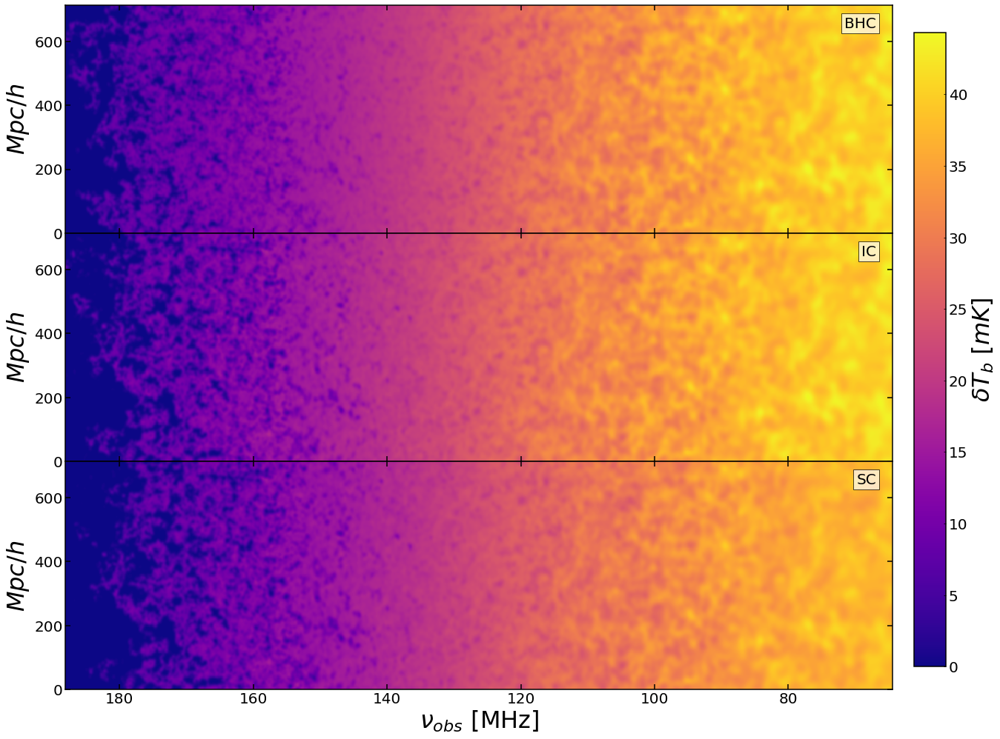

<Figure size 432x288 with 0 Axes>

In [19]:
plt.rcParams['font.size'] = 20

smooth = True

if(smooth):
    lightcone_mean = read_cbin('mean/lightcone/dataLightcone_dTb_B2km_Cmean.dat')
    z_mean = np.fromfile('mean/lightcone/Zlightcone_dTb_B2km_Cmean.dat', dtype=np.float64)
    #lightcone_mean, z_mean = smooth_lightcone(lightcone=lightcone_mean, z_array=z_mean, max_baseline=2.)

    lightcone_quad = read_cbin('quadfit/lightcone/dataLightcone_dTb_B2km_Cquadfit.dat')
    z_quad = np.fromfile('quadfit/lightcone/Zlightcone_dTb_B2km_Cquadfit.dat', dtype=np.float64)
    #lightcone_quad, z_quad = smooth_lightcone(lightcone=lightcone_quad, z_array=z_quad, max_baseline=2.)

    lightcone_scat = read_cbin('scat/lightcone/dataLightcone_dTb_B2km_Cscat.dat')
    z_scat = np.fromfile('scat/lightcone/Zlightcone_dTb_B2km_Cscat.dat', dtype=np.float64)
    #lightcone_scat, z_scat = smooth_lightcone(lightcone=lightcone_scat, z_array=z_scat, max_baseline=2.)
else:
    lightcone_mean = read_cbin('mean/lightcone/dataLightcone_dTb_Cmean.dat')
    z_mean = np.fromfile('mean/lightcone/Zlightcone_dTb_Cmean.dat', dtype=np.float64)
    
    lightcone_quad = read_cbin('quadfit/lightcone/dataLightcone_dTb_Cquadfit.dat')
    z_quad = np.fromfile('quadfit/lightcone/Zlightcone_dTb_Cquadfit.dat', dtype=np.float64)
    
    lightcone_scat = read_cbin('scat/lightcone/dataLightcone_dTb_Cscat.dat')
    z_scat = np.fromfile('scat/lightcone/Zlightcone_dTb_Cscat.dat', dtype=np.float64)
    
#my_ext = [z_to_nu(z_quad[0]), z_to_nu(z_quad[-1]), 0, 500*0.015623254745001935] # angular axis
#my_ext = [z_quad[0], z_quad[-1], 0, 500]                      # redshift axis
my_ext = [z_to_nu(z_quad[0]), z_to_nu(z_quad[-1]), 0, 500/0.7]     # freq axis

fig, axes = plt.subplots(figsize=(20, 17))
gs = gridspec.GridSpec(3, 1)
# THE FIRST SUBPLOT
ax0 = plt.subplot(gs[0])
#ax0.set_title('smoothed $B\,=\,2\,km$')
im = ax0.imshow(lightcone_mean[:,150,:len(z_quad)], cmap='plasma', extent=my_ext, aspect='auto')
ax0.set_ylabel('$Mpc/h$', size=labels_size*0.8)
ax0.tick_params(axis='both', length=7, width=1.5)
plt.text(0.98, 0.95, models.loc['mean', 'name'], size=20, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
# THE SECOND SUBPLOT
ax1 = plt.subplot(gs[1])
im = ax1.imshow(lightcone_quad[:,150,:len(z_quad)], cmap='plasma', extent=my_ext, aspect='auto')
ax1.set_ylabel('$Mpc/h$', size=labels_size*0.8)
ax1.tick_params(axis='both', length=7, width=1.5)
plt.text(0.98, 0.95, models.loc['quadfit', 'name'], size=20, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
# THE THIRT SUBPLOT
ax2 = plt.subplot(gs[2])
im = ax2.imshow(lightcone_scat[:,150,:len(z_quad)], cmap='plasma', extent=my_ext, aspect='auto')
plt.text(0.98, 0.95, models.loc['scat', 'name'], size=20, bbox=dict(facecolor='white', alpha=0.7), horizontalalignment='right', verticalalignment='top', transform=plt.gca().transAxes)
plt.setp(ax0.get_xticklabels(), visible=False), plt.setp(ax1.get_xticklabels(), visible=False)

ax2.set_ylabel('$Mpc/h$', size=labels_size*0.8)
ax2.set_xlabel(r'$\nu_{obs}$ [MHz]', size=labels_size*0.8)
#ax2.set_xlabel('z', size=labels_size*0.8)
ax2.tick_params(axis='both', length=7, width=1.5)

#axup = ax0.twiny()
#axup.imshow(np.zeros_like(lightcone_quad), extent=[z_quad[0], z_quad[-1], 0, 500]) # Create a dummy plot
#axup.cla()

im.set_clim(0., max([lightcone_mean.max(), lightcone_quad.max(), lightcone_scat.max()]))
cbar = fig.colorbar(im, cax=fig.add_axes([0.92, 0.15, 0.03, 0.7]))
cbar.set_label(r'$\delta T_b\,\, [mK]$', size=labels_size*0.8)

plt.subplots_adjust(hspace=0.)   # remove vertical gap between subplots
plt.savefig(work_path+'plotLightcone_dTb.png', bbox_inches='tight')
#plt.savefig('plotLightcone_B2km_dTb.png', bbox_inches='tight')
plt.show()
plt.clf()

## Cool Movie Creator
### Plots Slice dTb:
<p>Notebook to create cool movie gifs, you need <b>lightcone</b> file of the diffrential brightness dTb and its <b>redshift list.</b></p><p>Can be used also for xfrac files too, pay attention that you have manualy change axis name, filename, etc.</p>  

In [3]:
fit = 'scat'
os.chdir(work_path)

#lightcone = read_cbin('scat/lightcone/dataLightcone_dTb_Cscat.dat')
#redshift = read_raw_binary('scat/lightcone/Zlightcone_dTb_Cscat.dat')
lightcone = read_cbin('scat/lightcone/dataLightcone_dTb_B2km_Cscat.dat')
redshift = read_raw_binary('scat/lightcone/Zlightcone_dTb_B2km_Cscat.dat')
#lightcone, redshift = smooth_lightcone(lightcone=lightcone, z_array=redshift, max_baseline=2.)

#of_what = '_xi'
#of_what = '_dT'
of_what = '_dT_B2km'

In [4]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

cosmo = FlatLambdaCDM(Om0=0.27, Ob0=0.044, Tcmb0=2.7255, H0=70) 

# VERY LONG, LUNCH IT ONCE (~25 min)
os.chdir(work_path)
plt.rcParams['figure.max_open_warning'] = 2000

def BoxQuantity(LBox, z):
    dthet = (((LBox*u.Mpc/cosmo.h)/((1+z)*cosmo.angular_diameter_distance(z)))*u.rad).to(u.arcmin)
    dnu = (1.42*u.GHz*cosmo.H(z)*(LBox*u.Mpc/cosmo.h)/(cst.c*(1+z)**2)).to(u.MHz)
    return dthet, dnu


my_ext_S = [0, 714, 0, 714]     # Mpc/h axis
#my_ext_S = [-(500*0.0156)/2, (500*0.0156)/2, -(500*0.0156)/2, (500*0.0156)/2] # angular axis [deg]
#my_ext_L = [z_to_nu(redshift[0]), z_to_nu(redshift[-1]), -(300*0.01734)/2, (300*0.01734)/2] # angular axis [deg]
my_ext_L1 = [redshift[0], redshift[-1], -(300*0.01734)/2, (300*0.01734)/2]                      # redshift axis
#my_ext_L2 = [redshift[0], redshift[-1], 0, 500]                      # redshift axis
my_ext_L2 = [z_to_nu(redshift[0]), z_to_nu(redshift[-1]), 0, 714]     # freq axis

for i in tqdm(range(redshift.size)):
    z = redshift[i]
    nu = z_to_nu(z)
    dth, dnu = BoxQuantity(500./300, z)

    fig = plt.figure(figsize=(20, 22))
    gs = gridspec.GridSpec(2, 1, height_ratios=[2, 0.75])
    figsize_x, figsize_y = fig.get_size_inches()*fig.dpi

    # THE FIRST PLOT
    ax0 = plt.subplot(gs[0])
    ax0.set_title('z = %.3f\n 'r'$\Delta\theta_{res}$ = %.3f arcmin''\t'r' $\nu_{obs}$ = %.2f $\pm$ %.2f MHz' %(z, dth.value, nu, dnu.value/2) , size=26)
    im = ax0.imshow(lightcone[:,:,i], cmap='plasma', extent=my_ext_S)     # or cmap='jet' for blue to red

    cbar = fig.colorbar(im, cax=fig.add_axes([0.8, 0.4, 0.03, 0.46]))
    cbar.set_label('$\delta T_b$ $[mK]$', size=20)
    cbar.ax.tick_params(labelsize=18) 
    
    im.set_clim(0, 40)
    ax0.set_ylabel('$cMpc$', size=22), ax0.set_xlabel('$cMpc$', size=22)
    ax0.tick_params(axis='both', length=5, width=1, labelsize=17)
    ax0.minorticks_on()
    
    # EMBENDED PLOT
    axins = zoomed_inset_axes(ax0, 4, loc=2, bbox_to_anchor=(int(figsize_x*0.53), int(figsize_y*0.62)))
    imins = axins.imshow(lightcone[:,:,i], extent=my_ext_S, cmap='plasma')
    imins.set_clim(0, 40)
    
    x1, x2, y1, y2 = 140/0.7, 190/0.7, 270/0.7, 320/0.7
    axins.set_xlim(x1, x2), axins.set_ylim(y1, y2)
    [axins.spines[axis].set_linewidth(4) for axis in ['top','bottom','left','right']]
    axins.tick_params(axis='both', direction='in', top=True, right=True, length=10, width=1, labelsize=0)
    mark_inset(ax0, axins, loc1=3, loc2=1, ec='black', lw=3)
    
    # THE SECOND PLOT
    ax1 = plt.subplot(gs[1])
    ax1.imshow(lightcone[:,150,:], cmap='plasma', extent=my_ext_L1, aspect='auto')  # or cmap='jet' for blue to red
    #ax1.axvline(x=z, color='white', linewidth=3)

    # THE THIRD PLOT (JUST FOR SECOND X-AXIS)
    ax2 = ax1.twinx()
    ax2.imshow(lightcone[:,150,:], cmap='plasma', extent=my_ext_L2, aspect='auto')  # or cmap='jet' for blue to red
    ax2.set_ylabel('$cMpc$', size=20)
    ax2.tick_params(axis='both', top=True, length=5, width=1, labelsize=16)

    ax2.axvline(x=nu, color='white', linewidth=3)
    ax2.minorticks_on()

    for val in [180, 160, 140, 120, 100, 80]:
        plt.text(val, (500+10)/0.7, '%.1f' %(nu_to_z(val)), va='bottom', ha='center', size=20)
    plt.text((180.+80.)/2, (500+40)/0.7, 'z', va='bottom', ha='center', size=22)
    
    #ax1.set_ylabel('$cMpc/h$', size=16), ax1.set_xlabel(r'$\nu_{obs}$ [MHz]', size=16)
    ax1.set_ylabel(r'$\theta$ [deg]', size=20), ax1.set_xlabel(r'$\nu_{obs}$ [MHz]', size=20)
    ax1.tick_params(axis='both', top=True, length=5, width=1, labelsize=18)
    ax1.tick_params(which='minor', axis='both', top=True, length=3, width=1, labelsize=17)
    
    ax1.minorticks_on()
    plt.subplots_adjust(hspace=.22)   # remove vertical gap between subplots
    plt.savefig('%s/CoolMovie/plot_SL%d_CoolMovie%s.png' %(fit, i, of_what), bbox_inches='tight')
    plt.clf()

100%|██████████| 1068/1068 [46:49<00:00,  2.57s/it]


<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

<Figure size 1440x1584 with 0 Axes>

In [5]:
arr_images = [work_path+fit+'/CoolMovie/plot_SL'+str(i)+'_CoolMovie'+of_what+'.png' for i in range(redshift.size)][::-1]
CreateGif('coolmovie'+of_what+'_C'+fit+'_presentation', arr_images, scale= 0.5, fps=36, fmt='avi')

[MoviePy] >>>> Building video coolmovie_dT_B2km_Cscat_presentation.avi
[MoviePy] Writing video coolmovie_dT_B2km_Cscat_presentation.avi


100%|██████████| 1069/1069 [03:33<00:00,  6.61it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: coolmovie_dT_B2km_Cscat_presentation.avi 



512M	coolmovie_dT_B2km_Cscat_presentation.avi



<moviepy.video.io.ImageSequenceClip.ImageSequenceClip instance at 0x2aad8f31a518>

In [15]:
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
import astropy.constants as cst

cosmo = FlatLambdaCDM(Om0=0.27, Ob0=0.044, Tcmb0=2.7255, H0=70) 

def BoxQuantity(LBox, z):
    dthet = (((LBox*u.Mpc/cosmo.h)/((1+z)*cosmo.angular_diameter_distance(z)))*u.rad).to(u.deg)
    dnu = (1.42*u.GHz*cosmo.H(z)*(LBox*u.Mpc/cosmo.h)/(cst.c*(1+z)**2)).to(u.MHz)
    return dthet, dnu

print (0.003134083 * u.rad).to(u.arcmin)

dt, dn = BoxQuantity(244, 15.132)
print dt
print dn

10.7741837126 arcmin
1.87330743242 deg
14.9947176837 MHz


## Optical depth Thompson Scattering

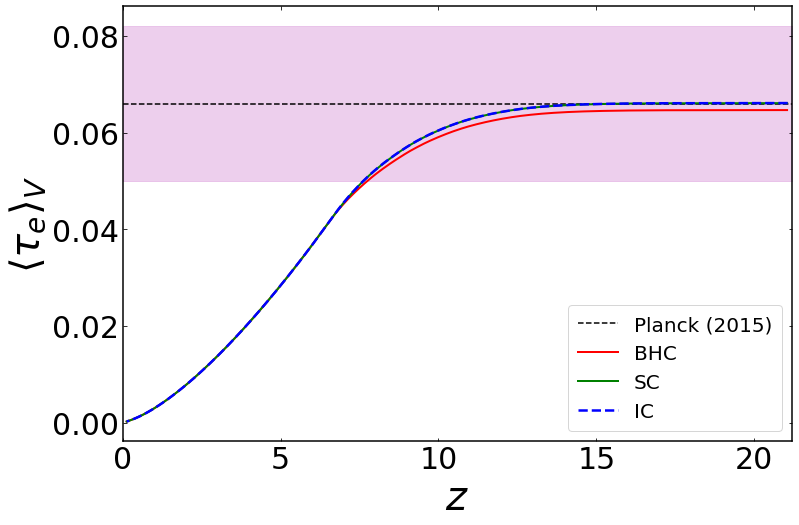

<Figure size 432x288 with 0 Axes>

In [8]:
fig = plt.figure(figsize=(12, 8))

#Planck TT+lowP+lensing+BAO
tauPlanck = 0.066
tauPlanck_1sig = 0.016

plt.axhline(y=tauPlanck,  color='black', ls='dashed', label='Planck (2015)')
plt.fill_between(np.linspace(0, 25, 10), tauPlanck-tauPlanck_1sig, tauPlanck+tauPlanck_1sig, color='plum', alpha=0.5)
#os.chdir('./Result_500Mpc_f5_8.2pS_300_stochastic_CAll/')
for i, fit in enumerate(['mean', 'scat', 'quadfit']):
    redshifts, tau_cube = np.loadtxt('%s/ThomTau/z_tau_%s.txt' %(fit,fit)), np.load('%s/ThomTau/tau0_%s.npy' %(fit,fit))

    tau0, tau_z = np.mean(np.mean(tau_cube, axis=1), axis=0)[::-1], redshifts[::-1]

    #print('Total tau %s:\t%.4f' %(models.loc[fit, 'name'], tau0[-1]))
    if(fit == 'mean'):
        name = 'BHC'
        col = 'r'
        styl = '-'
        lwid = 2
    elif(fit == 'quadfit'):
        name = 'IC'
        col= 'blue'
        styl = '--'
        lwid = 2.5
    else:
        name = 'SC'
        col = 'green'
        styl= '-'
        lwid = 2
    plt.plot(tau_z, tau0, color=col, label=name, linestyle=styl, lw=lwid)

plt.legend(loc=4, borderpad=0.5, prop={'size':20})
plt.ylabel(r'$\left<\tau_e\right>_V$', size=labels_size)
plt.xlabel('$z$', size=labels_size)
plt.xlim(0, 21.2)
plt.savefig('plotTaue_comparison.png', bbox_inches='tight')
plt.show()
plt.clf()

# Number of Recombination $ N_{rec}$

In [6]:
from tools21cm.conv import *
from tools21cm.const import *

import astropy.units as u
from astropy import constants as cst
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=H0, Om0=Omega0, Ob0=OmegaB)

set_sim_constants(500)  # Set 500 Mpc/h BoxSize

models = ModelsParameters()

alphB = (2.59e-13*u.cm**3/u.s).cgs
V_RTcell = ((500./0.7*300.*u.Mpc)**3).cgs
rho_b = cosmo.critical_density0.cgs * cosmo.Ob0
eta_He = 0.074
mu_H = 1.+4*eta_He/(1-eta_He)
nH = (rho_b / (mu_H * cst.m_p)).cgs
print(nH)

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3] 

1.8347616564932957e-07 1 / cm3


In [42]:
def Rcell(z, C=1, xHII=1):
    V_RTcell = (((500./300/0.7)**3)*u.Mpc**3).cgs
    rho_b = cosmo.critical_density0.cgs * cosmo.Ob0
    eta_He = 0.074
    mu_H = 1.+4*eta_He/(1-eta_He)
    nH = (rho_b / (mu_H * cst.m_p)).cgs
    return 1.08*alphB*V_RTcell*(1+z)**3 * C * (xHII*nH)**2

Rcell(7.305, xHII=0.5)


<Quantity 5.347e+50 1 / s>

In [40]:
# RUN ONCE, VERY LONG
redshift_c = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt')

for fit in models.index:
    #redshift = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results' %fit)[::-1]
    redshift_xf = get_xfrac_redshifts('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results/' %fit)
    redshift = np.sort(np.array(list(set(redshift_xf).intersection(redshift_c))))[::-1]
    
    avrg_Nrec = np.zeros_like(redshift)
    avrg_Rrec = np.zeros_like(redshift)            
    avrg_Nrec_under = np.zeros_like(redshift)
    avrg_Rrec_under = np.zeros_like(redshift)            
    avrg_Nrec_over = np.zeros_like(redshift)
    avrg_Rrec_ovrer = np.zeros_like(redshift)            
    
    for i in tqdm(range(len(redshift))):
        z = redshift[i]

        xHII = XfracFile('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results/xfrac3d_%.3f.bin' %(fit, z)).xi

        if(fit == 'mean'):
            par = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/res1.667_mean.txt' %fit, usecols=(0,1,2))
            C = SubgridClumping(z, *par)
        else:
            #idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), z)
            C = 10**read_cbin('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/z%.3f_res1.667_%s.dat' %(fit, z, fit))

        #idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), z)
        n_all = DensityFile('/its/home/mb756/inputs/sph_smooth_cubepm_130627_12_6912_500Mpc_ext2/global/so/nc300/%.3fn_all.dat' %z).cgs_density
        overdens = n_all/np.mean(n_all)
        nH = n_all*u.g/(u.cm**3)/mp
        #nH = rho_b/mu_H/mp # : comoving density (*(1+z)**3 for proper density) 

        Rcell = (1.08*alphB*V_RTcell*(1+z)**3 * C * (xHII*nH)**2).value
        Ncell = ((2./3.)*Rcell*mu_H*mp/(cosmo.H(z)*V_RTcell*rho_b)).cgs

        avrg_Rrec[i] = np.average(Rcell)
        avrg_Nrec[i] = np.average(Ncell)
        avrg_Rrec_under[i] = np.average(Rcell[overdens<0])
        avrg_Nrec_under[i] = np.average(Ncell[overdens<0])
        avrg_Rrec_over[i] = np.average(Rcell[overdens>0])
        avrg_Nrec_over[i] = np.average(Ncell[overdens>0])
        
    np.savetxt('%s/RecombRate_%s_interpolZ.txt' %(work_path+fit, fit), np.array([redshift, avrg_Rrec_under, avrg_Rrec_over, avrg_Rrec, avrg_Nrec]).T, fmt='%.3f\t%.3e\t%.3e\t%.3e\t%.3e', header='global volume averaged values\nz\tR underdens\tR overdens\tR [s^-1]\tNrec')


OSError: /its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt not found.

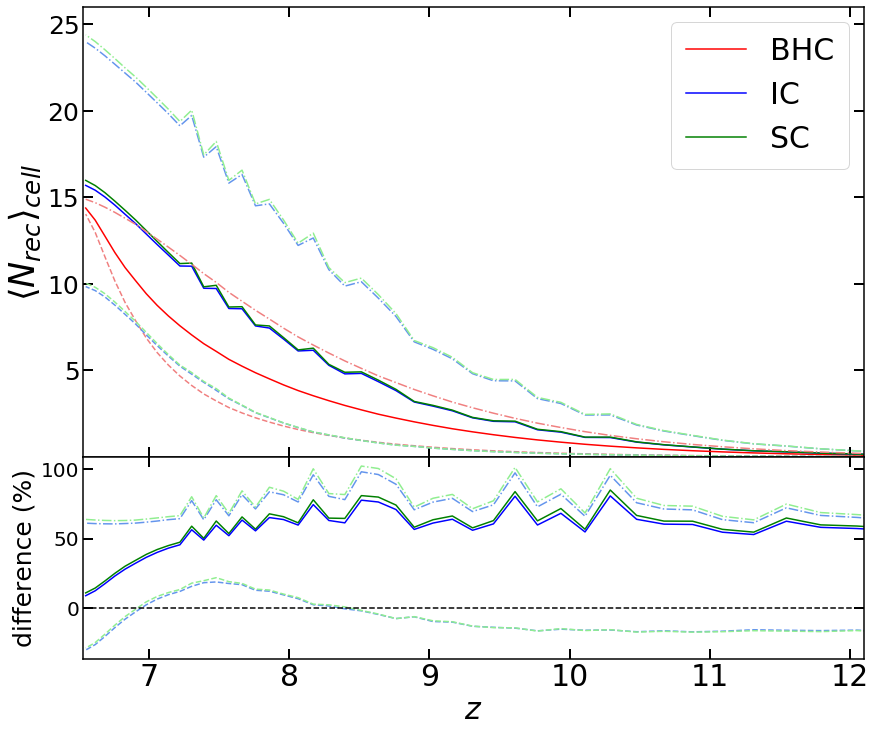

In [62]:
from matplotlib import gridspec
os.chdir(work_path)  # working directory

#for fit in models: # TO DO 
z_mean, avrgR_mean_under, avrgR_mean_over, avrgR_mean, avrgN_mean_under, avrgN_mean_over, avrgN_mean = np.loadtxt('%s/mean/RecombRate_mean.txt' %work_path, unpack=True)
z_quad, avrgR_quad_under, avrgR_quad_over, avrgR_quad, avrgN_quad_under, avrgN_quad_over, avrgN_quad = np.loadtxt('%s/quadfit/RecombRate_quadfit.txt' %work_path, unpack=True)
z_scat, avrgR_scat_under, avrgR_scat_over, avrgR_scat, avrgN_scat_under, avrgN_scat_over, avrgN_scat = np.loadtxt('%s/scat/RecombRate_scat.txt' %work_path, unpack=True)

z_mean, avrgR_mean_under, avrgR_mean_over, avrgR_mean, avrgN_mean_under, avrgN_mean_over, avrgN_mean = z_mean[:-1], avrgR_mean_under[:-1], avrgR_mean_over[:-1], avrgR_mean[:-1], avrgN_mean_under[:-1], avrgN_mean_over[:-1], avrgN_mean[:-1]
z_scat, avrgR_scat_under, avrgR_scat_over, avrgR_scat, avrgN_scat_under, avrgN_scat_over, avrgN_scat = z_scat[:-2], avrgR_scat_under[:-2], avrgR_scat_over[:-2], avrgR_scat[:-2], avrgN_scat_under[:-2], avrgN_scat_over[:-2], avrgN_scat[:-2]

diff_q_avrgN = 100*(avrgN_quad - avrgN_mean)/avrgN_mean  # raw comparison
diff_s_avrgN = 100*(avrgN_scat - avrgN_mean)/avrgN_mean   # raw comparison
diff_q_avrgN_under = 100*(avrgN_quad_under - avrgN_mean_under)/avrgN_mean_under  # raw comparison
diff_s_avrgN_under = 100*(avrgN_scat_under - avrgN_mean_under)/avrgN_mean_under   # raw comparison
diff_q_avrgN_over = 100*(avrgN_quad_over - avrgN_mean_over)/avrgN_mean_over  # raw comparison
diff_s_avrgN_over = 100*(avrgN_scat_over - avrgN_mean_over)/avrgN_mean_over   # raw comparison


# PLOTS
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(2, 1, height_ratios=[4, 1.8]) # set height ratios for sublots
# THE FIRST SUBPLOT
ax0 = plt.subplot(gs[0])
ax0.plot(z_mean, avrgN_mean, 'r-', label='BHC', lw=1.5)
ax0.plot(z_quad, avrgN_quad, 'b-', label='IC', lw=1.5)
ax0.plot(z_scat, avrgN_scat, 'g-', label='SC', lw=1.5)
ax0.plot(z_mean, avrgN_mean_under, color='lightcoral', ls='--')
ax0.plot(z_quad, avrgN_quad_under, color='cornflowerblue', ls='--')
ax0.plot(z_quad, avrgN_scat_under, color='lightgreen', ls='--')
ax0.plot(z_mean, avrgN_mean_over, color='lightcoral', ls='-.')
ax0.plot(z_quad, avrgN_quad_over, color='cornflowerblue', ls='-.')
ax0.plot(z_quad, avrgN_scat_over, color='lightgreen', ls='-.')
#ax0.set_yscale('log')
#ax0.fill_between(z_mean, avrgR_mean_under/b*a, avrgR_mean_over/b*a, color='lightcoral', alpha=0.2)
#ax0.fill_between(z_quad, avrgR_quad_under/b*a, avrgR_quad_over/b*a, color='cornflowerblue', alpha=0.1)
#ax0.fill_between(z_quad, avrgR_scat_under/b*a, avrgR_scat_over/b*a, color='lightgreen', alpha=0.1)
ax0.legend(loc=1, borderpad=0.5)
ax0.tick_params(axis='both', length=10, width=2, labelsize=25)
ax0.set_ylim(0.0001, 26)
#ax0.set_ylim(-1, 26)
ax0.set_xlim(z_mean.min()-0.02, 12.1)
#ax0.set_xlim(6.3, 16.5)
ax0.set_ylabel(r'$\left<N_{rec} \right>_{cell}$', size=labels_size-5)
# THE SECORD SUBPLOT
ax1 = plt.subplot(gs[1], sharex = ax0)
ax1.plot(z_mean, diff_s_avrgN, 'g-', lw=1.5)
ax1.plot(z_quad, diff_q_avrgN, 'b-', lw=1.5)
ax1.tick_params(axis='both', length=10, width=2), ax1.tick_params(axis='y', labelsize=20)
#ax1.set_xlim(z_mean.min()-0.02, 12.1)
#ax1.set_ylim(62, 140)
#ax1.set_ylim(-40, 150)
ax1.set_ylabel('difference (%)', size=labels_size-15)
ax1.set_xlabel('$z$', size=labels_size-10)
ax1.plot(z_quad, diff_q_avrgN_under, color='cornflowerblue', ls='--')
ax1.plot(z_quad, diff_q_avrgN_over, color='cornflowerblue', ls='-.')
ax1.plot(z_quad, diff_s_avrgN_under, color='lightgreen', ls='--')
ax1.plot(z_quad, diff_s_avrgN_over, color='lightgreen', ls='-.')
#ax1.fill_between(z_quad, diff_q_avrgR_under, diff_q_avrgR_over, color='cornflowerblue', alpha=0.1)
#ax1.fill_between(z_quad, diff_s_avrgR_under, diff_s_avrgR_over, color='lightgreen', alpha=0.1)
ax1.axhline(y=0,  color='black', ls='dashed')
# PLOT SETUP

plt.setp(ax0.get_xticklabels(), visible=False) # remove x label from fist plot
#plt.yticks[0].label1.set_visible(False)
plt.subplots_adjust(hspace=.0)   # remove vertical gap between subplots
plt.savefig('plotNRate.png', bbox_inches='tight')


In [33]:
FindNearest??

In [53]:
MergeImages('plotRec+Ion', ['plot_IonRate.png', 'plotRecombRate.png'], output_path='./', form='h', delete_old=False)

# Bubble Statistic

In [5]:
models = ModelsParameters([0.3, 0.5, 0.7, 0.9])

For mean ionized fraction (volume):	xHII = [0.3 0.5 0.7 0.9] 



In [6]:
models

,name,color,style,lw,redshift_to_xHII,redshift_dT_to_xHII,xHII,xHI
mean,GCM,r,-,2,"[9.533, 8.118, 7.221, 6.721]","[9.457, 8.064, 7.221, 6.686]","[0.3016, 0.4999, 0.6994, 0.8974]","[0.698, 0.5, 0.301, 0.103]"
quadfit,DCM,b,--,3.5,"[9.611, 8.34, 7.48, 6.905]","[9.611, 8.283, 7.48, 6.905]","[0.3037, 0.4961, 0.7026, 0.898]","[0.696, 0.504, 0.297, 0.102]"
scat,SCM,g,-,2,"[9.611, 8.34, 7.48, 6.905]","[9.611, 8.283, 7.48, 6.905]","[0.3039, 0.4962, 0.7031, 0.8983]","[0.696, 0.504, 0.297, 0.102]"


OSError: BSD_MFP_xi_z10.574_xth09.txt not found.

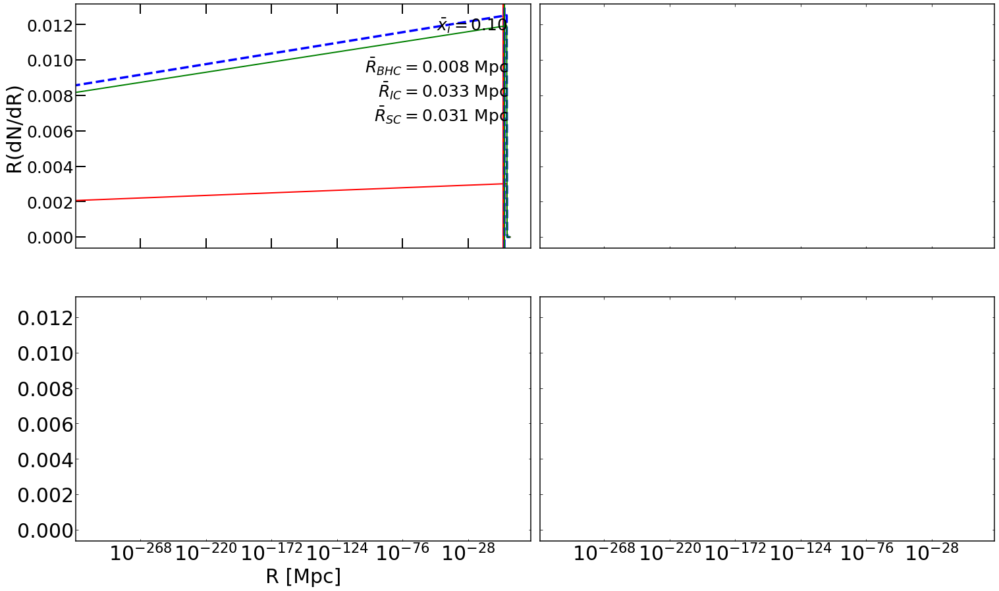

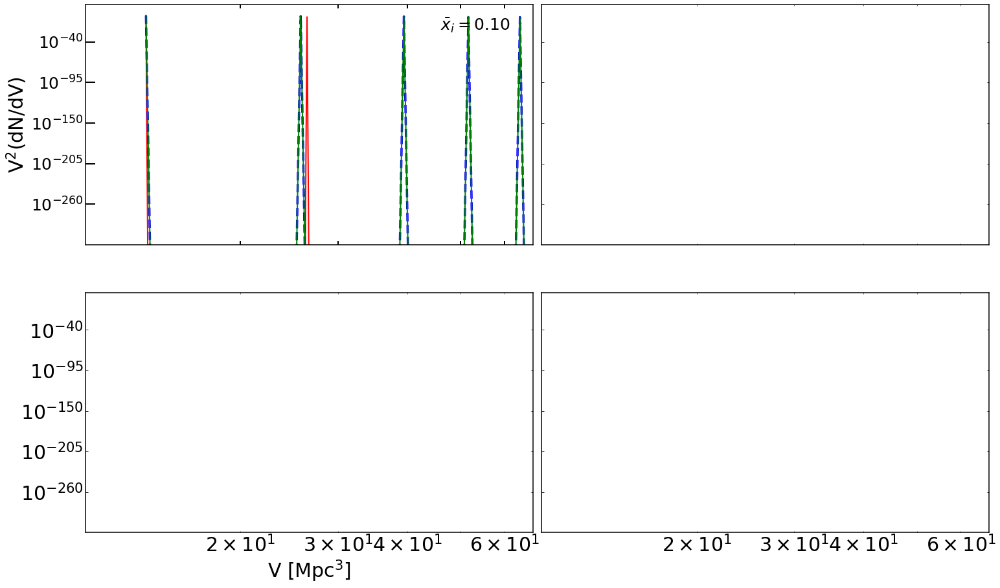

In [8]:
from scipy import integrate
from tools21cm import conv

# MFP
#fig1, ax1 = plt.subplots(nrows=1, ncols=models.loc['mean', 'redshift_to_xHII'].size, figsize=(50, 10), sharex=True, sharey=True)
fig1, ax1 = plt.subplots(nrows=2, ncols=2, figsize=(25, 15), sharex=True, sharey=True)
fig1.subplots_adjust(wspace = 0.02)

# FOF
#fig2, ax2 = plt.subplots(nrows=1, ncols=models.loc['mean', 'redshift_to_xHII'].size, figsize=(50, 10), sharex=True, sharey=True)
fig2, ax2 = plt.subplots(nrows=2, ncols=2, figsize=(25, 15), sharex=True, sharey=True)
fig2.subplots_adjust(wspace = 0.02)

set_sim_constants(boxsize_cMpc=500)
volume_resolution = (conv.LB/300)**3

xth = 0.9
typ = 'i' # 'n' for neutral, 'i' for ionized

idx = [(x, y) for x in range(2) for y in range(2)]

for i in range(models.loc['mean', 'redshift_to_xHII'].size):
    txtR = r'$\bar{x}_i = %.2f$''\n\n' %(models['xHII'].mean()[i])
    txtV = r'$\bar{x}_i = %.2f$' %(models['xHII'].mean()[i])
    index = idx[i]
    for fit in models.index:
        z = models.loc[fit, 'redshift_to_xHII'][i]
        os.chdir(work_path+fit+'/BubbleStat')

        rs, rdn = np.loadtxt('BSD_MFP_x%s_z%.3f_xth0%s.txt' %(typ, z, str(xth)[2:]), unpack=True)
        rC = integrate.simps(rdn, rs)
        #print fit, z, '\t%3e' %integrate.simps(rs*rs*rdn, rs)        
        #print fit, z, '\t', rs[np.argmax(rdn)], rC
        #print np.min(rs[np.nonzero(rs)])
        #rC = rs[np.argmax(rdn)]
        vs, vdn = np.loadtxt('BSD_FOF_x%s_z%.3f_xth0%s.txt' %(typ, z, str(xth)[2:]), unpack=True)

        if(list(vdn).count(vdn.min()) > 1):
            low_limit = vdn.min()
            vdn[vdn == low_limit] = 0
        else: 
            pass
        
        ax1[index].semilogx(rs, rdn, color=models.loc[fit, 'color'], label=models.loc[fit, 'name'], linestyle=models.loc[fit, 'style'], lw=models.loc[fit, 'lw'])
        ax1[index].axvline(x=rC, color=models.loc[fit, 'color'], linestyle=models.loc[fit, 'style'], lw=models.loc[fit, 'lw'])

        ax2[index].loglog(vs, vdn, color=models.loc[fit, 'color'], label=models.loc[fit, 'name'], linestyle=models.loc[fit, 'style'], lw=models.loc[fit, 'lw'])

        txtR += r'$\bar{R}_{%s} = %.3f$ Mpc''\n' %(models.loc[fit, 'name'], rC)

        ax1[index].tick_params(axis='both', direction='in', top=True, right=False, length=15, width=2, labelsize=25)    
        ax1[index].tick_params(which='minor', axis='both', top=True, length=6, width=2)
        ax2[index].tick_params(axis='both', direction='in', top=True, right=False, length=15, width=2, labelsize=25)    
        ax2[index].tick_params(which='minor', axis='both', top=True, length=6, width=2)
    #print '\n'
    ax2[index].set_xlim(volume_resolution-3, vs.max()), 
    
    ax1[1,index[1]].set_xlabel('R [Mpc]'), ax1[index[0],0].set_ylabel('R(dN/dR)')
    ax2[1,index[1]].set_xlabel('V [Mpc$^3$]'), ax2[index[0],0].set_ylabel('V$^2$(dN/dV)')


    ax1[index].text(0.95, 0.95, txtR, size=25, horizontalalignment='right', verticalalignment='top', transform=ax1[index].transAxes)
    ax2[index].text(0.95, 0.95, txtV, size=25, horizontalalignment='right', verticalalignment='top', transform=ax2[index].transAxes)

#ax1[1].set_title('MFP-BSD')
#ax1[0].set_xlim(2.38095, 900)
ax1[0,0].legend(loc='upper left')

#ax2[1].set_title('FOF-BSD')
#ax2[i].set_ylim(5e-7, 5e-1)
ax2[0,0].legend(loc='upper left')
fig1.subplots_adjust(wspace =0., hspace=0.)
fig2.subplots_adjust(wspace =0., hspace=0.)

os.chdir(work_path)
#fig1.savefig('plotBSD_MFP_x%s_xth0%s' %(typ, str(xth)[2:]), bbox_inches='tight')     # save Plot
#fig2.savefig('plotBSD_FOF_x%s_xth0%s' %(typ, str(xth)[2:]), bbox_inches='tight')     # save Plot

plt.show()
fig1.clf()
fig2.clf()

In [97]:
MergeImages('plotBSD_paper', ['plotBSD_MFP_xi_xth09.png', 'plotBSD_FOF_xi_xth09.png'], output_path=work_path, form='h')

# Power Spectra 21cm

In [29]:
#models = ModelsParameters(np.linspace(0.05, 0.97, 30))
models = ModelsParameters([0.1, 0.3, 0.5, 0.7, 0.9 ,0.99])

For mean ionized fraction (volume):	xHII = [0.1  0.3  0.5  0.7  0.9  0.99] 



In [30]:
models

,name,color,style,lw,redshift_to_xHII,redshift_dT_to_xHII,xHII,xHI
mean,BHC,r,-,2,"[11.918, 9.533, 8.118, 7.221, 6.721, 6.483]","[11.918, 9.533, 8.118, 7.221, 6.721, 6.483]","[0.1018, 0.3016, 0.4999, 0.6994, 0.8974, 0.9912]","[0.898, 0.698, 0.5, 0.301, 0.103, 0.009]"
quadfit,IC,b,--,3.5,"[11.918, 9.611, 8.34, 7.48, 6.905, 6.583]","[11.918, 9.611, 8.34, 7.48, 6.905, 6.583]","[0.1024, 0.3037, 0.4961, 0.7026, 0.898, 0.9888]","[0.898, 0.696, 0.504, 0.297, 0.102, 0.011]"
scat,SC,g,-,2,"[11.918, 9.611, 8.34, 7.48, 6.905, 6.549]","[11.918, 9.611, 8.34, 7.48, 6.905, 6.549]","[0.1025, 0.3039, 0.4962, 0.7031, 0.8983, 0.9917]","[0.898, 0.696, 0.504, 0.297, 0.102, 0.008]"


In [ ]:
from tools21cm import power_spectrum_1d, dimensionless_ps
from myutils.utils import FindNearest
set_sim_constants(boxsize_cMpc=500)

#redshift = [11.791, 9.611, 8.283, 7.48, 6.905, 6.549]
#redshift = [11.791, 10.673, 9.611, 8.892, 8.064, 7.48, 7.059, 6.905, 6.549]

#redshift = [11.791, 10.673, 9.611, 8.892, 8.172, 8.064, 7.305, 7.059, 6.905]#, 6.617]
hsize, vsize = 2, 3

plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
fig, axes = plt.subplots(hsize, vsize, figsize=(28,15), sharex=True, sharey=True)

idx = 0
for i in range(hsize):
    for j in range(vsize):
        for fit in models.index:
            z = models.loc[fit, 'redshift_dT_to_xHII'][idx]
            #z = redshift[idx]
            
            #dT = read_cbin(work_path+'%s/21cm/dTb_data/dTb_cbin_z%.3f.dat' %(fit, z))
            LC = read_cbin(work_path+'%s/lightcone/dataLightcone_dTb_C%s.dat' %(fit,fit))
            redlc = np.fromfile(work_path+'%s/lightcone/Zlightcone_dTb_C%s.dat' %(fit,fit), dtype=np.float64)
            idx_lc, z_lc = FindNearest(redlc, z)
            dT = LC[...,idx_lc]
            Pk, k = power_spectrum_1d(dT, kbins=25, binning='log')
            delt21 = k*k*k*Pk/(2*pi*pi)
            #k /= 2.*pi # I don't know why but in tools21cm k *=2*pi ????
            #np.savetxt(work_path+fit+'Pk_data/21cm/Pk21cm_z%.3f_%s.txt' %(z, fit), np.array([k, delt21]).T, fmt='%.4e', header='k [1/Mpc]\tk*k*k*Pk/(2*pi*pi) [mK2]', delimiter='\t')
            
            #k, delt21 = np.loadtxt(work_path+fit+'/21cm/Pk_data/Pk21cm_z%.3f.txt' %z, unpack=True)
            
            axes[i,j].plot(k, delt21, models.loc[fit,'style']+models.loc[fit,'color'], label=models.loc[fit, 'name'], lw=3)
        
        idx_z, val_z = FindNearest(models['redshift_dT_to_xHII'].mean(), z)
        txt1 = r'$\bar{x}_i = %.2f$' %(models['xHII'].mean()[idx_z])
        axes[i,j].text(0.07, 0.93, txt1, size=30, horizontalalignment='left', verticalalignment='top', transform=axes[i,j].transAxes)
        #txt1 = r'$\bar{x}_{HII} \approx %.2f$' %(models['xHII'].mean()[idx])
        #axes[i,j].text(0.05, 1.5e1, txt1, size=22, horizontalalignment='left', verticalalignment='top')
        #txt2 = r'z $\approx$ %.1f' %(models['redshift_dT_to_xHII'].mean()[idx])
        #txt2 = r'z = %.3f' %z
        #axes[i,j].text(5e-3, 1.5e1, txt2, size=30, horizontalalignment='left', verticalalignment='top', transform=axes[i,j].transAxes)
        [axes[i,j].spines[axis].set_linewidth(3) for axis in ['top','bottom','left','right']]
        axes[i,j].tick_params(axis='both', direction='in', top=True, right=True, length=15, width=2, labelsize=25)    
        axes[i,j].tick_params(which='minor', axis='both', top=True, length=6, width=2)

        axes[i,j].set_xscale('log')
        axes[i,j].set_yscale('log')
        #print(idx)
        if(i == max(range(hsize))):
            axes[i,j].set_xlabel('k $[Mpc^{-1}]$', size=25)
        if(j == 0):
            axes[i,j].set_ylabel(r'$\Delta^2_{21}(k)$ $[mK^2]$', size=25)
        if(idx == 0):
            axes[i,j].legend(loc=4, borderpad=0.5, prop={'size':18})
        idx+=1

#plt.xlim(3.25e-2, 2)
#plt.ylim(2e-4, 10)
fig.subplots_adjust(wspace=0., hspace=0.)
plt.savefig('plot_21cmPk_LC.png', bbox_inches='tight')

plt.show()
plt.clf()

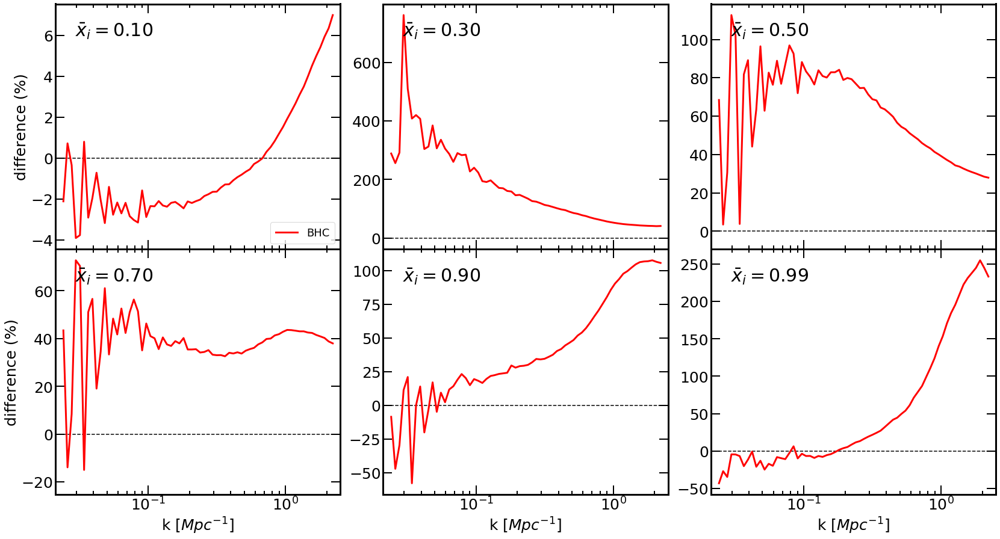

<Figure size 432x288 with 0 Axes>

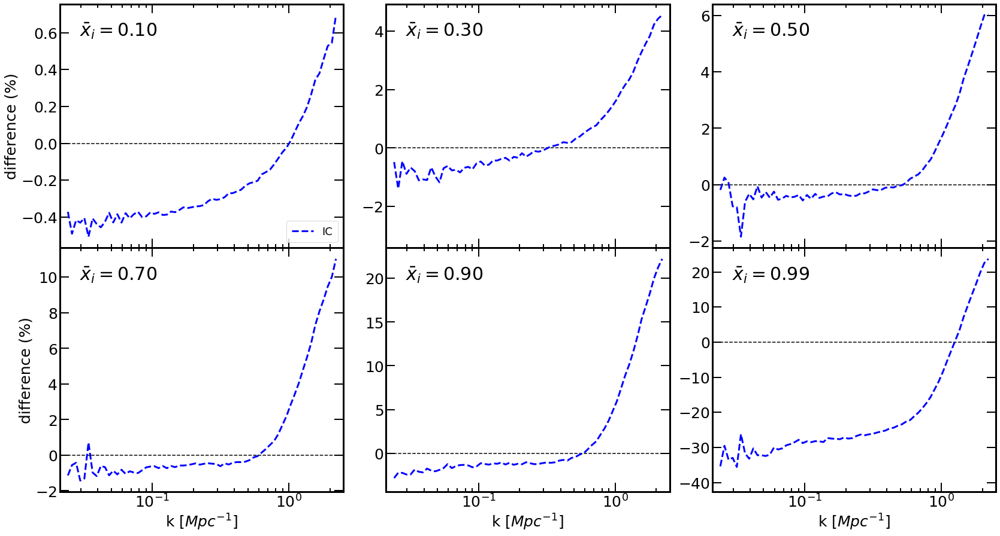

<Figure size 432x288 with 0 Axes>

In [83]:
from tools21cm import power_spectrum_1d, dimensionless_ps
set_sim_constants(boxsize_cMpc=500)

def plot_Pk_diff(fit):
    hsize, vsize = 2, 3

    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    fig, axes = plt.subplots(hsize, vsize, figsize=(28,15), sharex=True, sharey=False)


    idx = 0
    for i in range(hsize):
        for j in range(vsize):
            for fit in [fit]:
                z = models.loc[fit, 'redshift_dT_to_xHII'][idx]
                k, delt21_scat = np.loadtxt(work_path+'scat'+'/21cm/Pk_data/Pk21cm_z%.3f.txt' %models.loc['scat', 'redshift_dT_to_xHII'][idx], unpack=True)
                k, delt21 = np.loadtxt(work_path+fit+'/21cm/Pk_data/Pk21cm_z%.3f.txt' %z, unpack=True)
                axes[i,j].plot(k, 100*(delt21_scat/delt21-1), models.loc[fit,'style']+models.loc[fit,'color'], label=models.loc[fit, 'name'], lw=3)
                axes[i,j].hlines(y=0, xmin=k.min(), xmax=k.max(), linestyles='--')
            idx_z, val_z = FindNearest(models['redshift_dT_to_xHII'].mean(), z)
            txt1 = r'$\bar{x}_i = %.2f$' %(models['xHII'].mean()[idx_z])
            axes[i,j].text(0.07, 0.93, txt1, size=30, horizontalalignment='left', verticalalignment='top', transform=axes[i,j].transAxes)
            [axes[i,j].spines[axis].set_linewidth(3) for axis in ['top','bottom','left','right']]
            axes[i,j].tick_params(axis='both', direction='in', top=True, right=True, length=15, width=2, labelsize=25)    
            axes[i,j].tick_params(which='minor', axis='both', top=True, length=6, width=2)

            axes[i,j].set_xscale('log')
            #axes[i,j].set_yscale('log')
            #print(idx)
            if(i == max(range(hsize))):
                axes[i,j].set_xlabel('k $[Mpc^{-1}]$', size=25)
            if(j == 0):
                axes[i,j].set_ylabel(r'difference (%)', size=25)
            if(idx == 0):
                axes[i,j].legend(loc=4, borderpad=0.5, prop={'size':18})
            idx+=1

    plt.xlim(2.1e-2, 2.5)
    #plt.ylim(2e-3, 5e1)
    fig.subplots_adjust(wspace=0.15, hspace=0.)
    #plt.savefig('plot_21cmPk.png', bbox_inches='tight')
    plt.show()
    plt.clf()
    
plot_Pk_diff(fit='mean')
plot_Pk_diff(fit='quadfit')

# Mean $\bar{\delta T_b}$ & RMS $<\delta T_b>^{1/2}$ plots from LightCone

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3] 

7.059
mean
z=7.059		nu=176.201	x_n=0.249

7.391
quadfit
z=7.391		nu=169.229	x_n=0.275

7.391
scat
z=7.391		nu=169.229	x_n=0.275



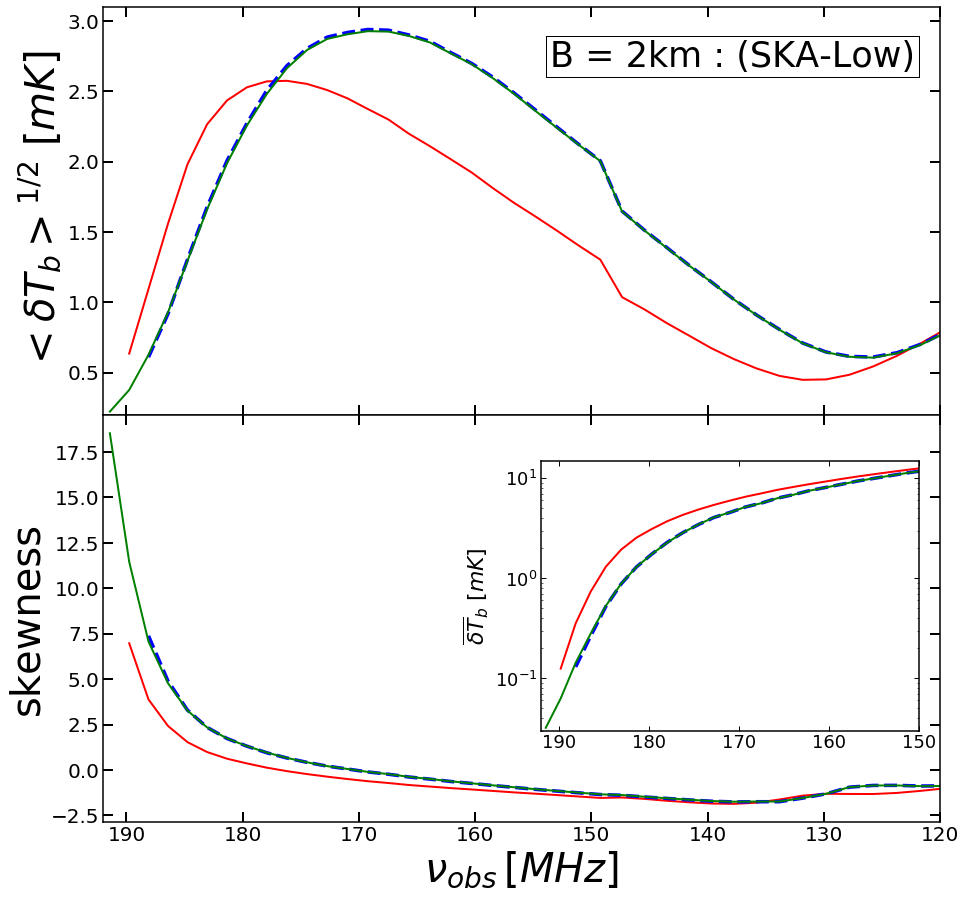

...done.


<Figure size 432x288 with 0 Axes>

In [12]:
set_verbose(False)
plt.rcParams['font.size'] = 20

models = ModelsParameters()

f_mean = 1.-data_mean['xHII_v'].values
f_quad = 1.-data_quad['xHII_v'].values
f_scat = 1.-data_scat['xHII_v'].values


fig, ax = plt.subplots(2, figsize=(15, 15), sharex=True)
#axin = plt.axes([0.53, 0.53, 0.35, 0.25])
axin = plt.axes([0.53, 0.21, 0.35, 0.25])

for fit in models.index:
    redshift, lamb_obs, nu_obs, mean_dT, rms_dT, skew_dT, SKA_mean_dT, SKA_rms_dT, SKA_skew_dT = loadtxt('%s/21cm/dTb_data_%s.txt' %(fit, fit), unpack=True, usecols=(0,1,2,3,4,5,6,7,8))
    # PLOT 1
    ax[0].plot(nu_obs, SKA_rms_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=fit)
    #ax[0].plot(redshift, LOFAR_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=fit)
    #ax[0].plot(redshift, PAST_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=fit)
    ax[0].set_ylabel(r'$<\delta T_b>^{1/2}$ $[mK]$', size=labels_size)
    ax[0].text(0.97, 0.92, 'B = 2km : (SKA-Low)', size=labels_size-5, bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[0].transAxes)
    ax[0].set_xlim(192, 120), ax[0].set_ylim(0.2, 3.1)
    ax[0].tick_params(axis='both', length=10, width=2)
    
    print(redshift[np.argmax(SKA_rms_dT)])
    
    # EMBENDED PLOT
    axin.plot(nu_obs, SKA_mean_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=fit)
    axin.set_ylabel(r'$\overline{\delta T}_b$ $[mK]$', size=22)
    axin.tick_params(axis='both', length=5, width=1, labelsize=18)
    axin.set_xlim(192, 150), axin.set_ylim(3e-2, 15)
    axin.set_yscale('log')
    
    # PLOT 2
    ax[1].plot(nu_obs, SKA_skew_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=fit)
    ax[1].set_xlabel(r'$\nu_{obs}\,[MHz]$', size=labels_size), ax[1].set_ylabel(r'skewness', size=labels_size)
    #plt.legend(loc=1, borderpad=0.5, prop={'size':10})
    ax[1].set_xlim(192, 120)
    ax[1].tick_params(axis='both', length=10, width=2)
    
    mesg = 'z=%.3f\t\tnu=%.3f' %(redshift[np.argmax(SKA_rms_dT)], nu_obs[np.argmax(SKA_rms_dT)])
    print(fit)
    if(fit == 'mean'):
        idx, val = FindNearest(data_mean['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_mean[int(idx)]))
    elif(fit == 'quadfit'):
        idx, val = FindNearest(data_quad['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_quad[int(idx)]))
    elif(fit == 'scat'):
        idx, val = FindNearest(data_quad['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_quad[int(idx)]))



fig.subplots_adjust(hspace = 0.)
plt.savefig('plotRMS_dTb_B2km.png', bbox_inches='tight')     # save Plot
plt.show()
plt.clf()    
print('...done.')

# Mean $\bar{\delta T_b}$ & RMS $<\delta T_b>^{1/2}$ plots

mean
z=7.060		nu=176.186	x_n=0.249

quadfit
z=7.388		nu=169.298	x_n=0.275

scat
z=7.558		nu=165.922	x_n=0.327



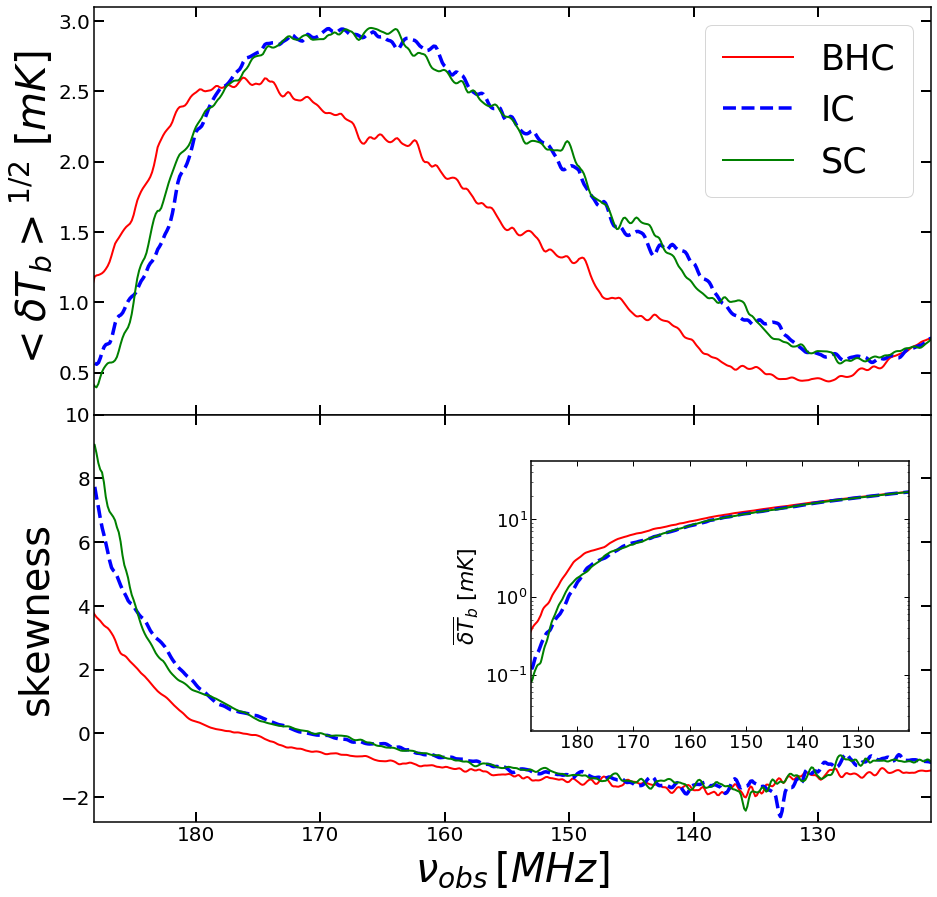

...done.


<Figure size 432x288 with 0 Axes>

In [13]:
from tools21cm import skewness

set_verbose(False)
plt.rcParams['font.size'] = 20

#models = ModelsParameters()

fig, ax = plt.subplots(2, figsize=(15, 15), sharex=True)
#axin = plt.axes([0.53, 0.53, 0.35, 0.25])
axin = plt.axes([0.53, 0.21, 0.35, 0.25])

f_mean = 1.-data_mean['xHII_v'].values
f_quad = 1.-data_quad['xHII_v'].values
f_scat = 1.-data_scat['xHII_v'].values

for fit in models.index:
    lightcone = read_cbin('%s/lightcone/dataLightcone_dTb_B2km_C%s.dat' %(fit, fit))
    redshift = np.fromfile('%s/lightcone/Zlightcone_dTb_B2km_C%s.dat' %(fit, fit), dtype=np.float64)
    nu_obs = z_to_nu(redshift)

    SKA_mean_dT = [np.mean(lightcone[:,:,i]) for i in range(nu_obs.size)]
    SKA_rms_dT = [np.std(lightcone[:,:,i]) for i in range(nu_obs.size)]
    SKA_skew_dT = [skewness(lightcone[:,:,i]) for i in range(nu_obs.size)]
    
    mesg = 'z=%.3f\t\tnu=%.3f' %(redshift[np.argmax(SKA_rms_dT)], nu_obs[np.argmax(SKA_rms_dT)])
    print(fit)
    if(fit == 'mean'):
        idx, val = FindNearest(data_mean['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_mean[int(idx)]))
    elif(fit == 'quadfit'):
        idx, val = FindNearest(data_quad['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_quad[int(idx)]))
    elif(fit == 'scat'):
        idx, val = FindNearest(data_quad['z'].values, redshift[np.argmax(SKA_rms_dT)])
        print('%s\tx_n=%.3f\n' %(mesg, f_quad[int(idx)]))
    
    #print(SKA_rms_dT[idx] , np.max(SKA_rms_dT))

    # PLOT 1
    ax[0].plot(nu_obs, SKA_rms_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'], label=models.loc[fit, 'name'])
    ax[0].set_ylabel(r'$<\delta T_b>^{1/2}$ $[mK]$', size=labels_size)
    #ax[0].text(0.97, 0.92, 'B = 2km : (SKA-Low)', size=labels_size-5, bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[0].transAxes)
    ax[0].set_xlim(188.2, 121), ax[0].set_ylim(0.2, 3.1)
    ax[0].tick_params(axis='both', length=10, width=2)
    ax[0].legend(loc=1, borderpad=0.5, prop={'size':labels_size-5})
    
    # EMBENDED PLOT
    axin.plot(nu_obs, SKA_mean_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'])
    axin.set_ylabel(r'$\overline{\delta T}_b$ $[mK]$', size=22)
    axin.tick_params(axis='both', length=5, width=1, labelsize=18)
    axin.set_xlim(188.2, 121)#, axin.set_ylim(3e-2, 15)
    axin.set_yscale('log')
    
    # PLOT 2
    ax[1].plot(nu_obs, SKA_skew_dT, models.loc[fit,'color']+models.loc[fit,'style'], lw=models.loc[fit, 'lw'])
    ax[1].set_xlabel(r'$\nu_{obs}\,[MHz]$', size=labels_size), ax[1].set_ylabel(r'skewness', size=labels_size)
    ax[1].set_xlim(188.2, 121), ax[1].set_ylim(-2.8, 10)
    ax[1].tick_params(axis='both', length=10, width=2)

fig.subplots_adjust(hspace = 0.)
plt.savefig('plotRMS_LC_dTb_B2km.png', bbox_inches='tight')     # save Plot
plt.show()
plt.clf()    
print('...done.')

In [17]:
fit = 'mean'
lightcone = read_cbin('%s/lightcone/dataLightcone_dTb_B2km_C%s.dat' %(fit, fit))
redshift = np.fromfile('%s/lightcone/Zlightcone_dTb_B2km_C%s.dat' %(fit, fit), dtype=np.float64)
idx_LC, z_LC = FindNearest(redshift, 7.060)
np.mean(lightcone[...,idx_LC])

4.163762

# PDF distribution of the 21-cm signal

For mean ionized fraction (volume):	xHII = [0.1 0.3 0.5 0.7 0.9] 

z = [11.918  9.533  8.118  7.221  6.721]
xi = [0.102 0.302 0.5   0.699 0.897]
17834448	66.054 %
256266	0.949 %
0	0.000 %
0	0.000 %
0	0.000 %
done mean

z = [11.918  9.611  8.34   7.48   6.905]
xi = [0.102 0.304 0.496 0.703 0.898]
17793808	65.903 %
452700	1.677 %
3612	0.013 %
387	0.001 %
184	0.001 %
done quadfit

z = [11.918  9.611  8.34   7.48   6.905]
xi = [0.102 0.304 0.496 0.703 0.898]
17804358	65.942 %
528727	1.958 %
4100	0.015 %
1192	0.004 %
337	0.001 %
done scat



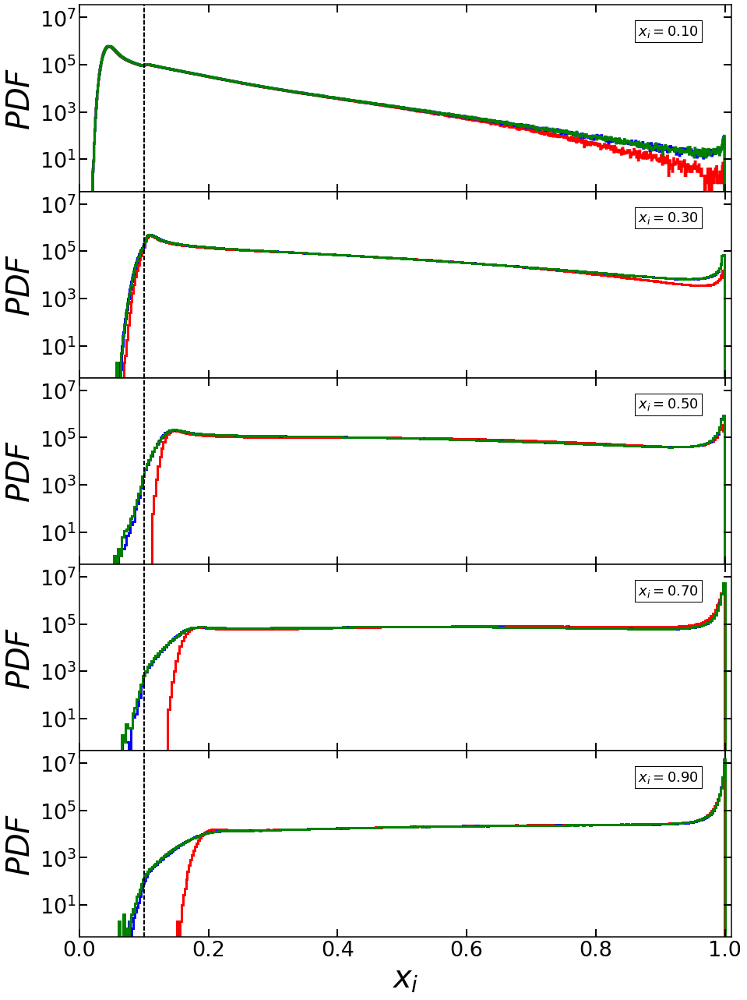

<Figure size 432x288 with 0 Axes>

In [11]:
from clump_functions import getSmartBin

os.chdir(work_path)
plt.rcParams['font.size'] = 18
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True


#models = ModelsParameters(np.linspace(0.05, 0.97, 15))
xi_target = [0.1, 0.3, 0.5, 0.7, 0.9]
models = ModelsParameters(xi_target)
fig, ax = plt.subplots(len(xi_target), figsize=(15, 22), sharex=True, sharey=True)

for fit in models.index:
    #redshift = [11.791, 9.611, 8.283, 7.48, 6.905, 6.549]
    #redshift = [11.791, 9.611, 8.283, 7.48, 6.905]
    redshift = models.loc[fit, 'redshift_to_xHII']
    xHII = models.loc[fit, 'xHII']
    print 'z =',redshift 
    print 'xi =', xHII
    redshift_sample = np.mean(models['redshift_to_xHII'], axis=0)
    xHII_sample = models['xHII'].mean()
        
    for i in range(len(redshift)):
        z = redshift[i]
        idx_z, val_z = FindNearest(models['redshift_to_xHII'].mean(), z)
        
        xi = XfracFile('/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results/xfrac3d_%.3f.bin' %(fit, z)).xi
        """
        if(fit == 'mean'):
            par = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/res1.667_mean.txt' %fit, usecols=(0,1,2))
            C = SubgridClumping(z, *par)# *np.ones(300**3)
        else:
            idx, z = FindNearest(np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt'), z)
            C = 10**read_cbin('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/z%.3f_res1.667_%s.dat' %(fit, z, fit))
        xi = C
        """
        n, bins, _ = ax[i].hist(xi.flatten(), bins='scott', stacked=True, histtype='step', lw=3, color=models.loc[fit,'color'])
        mid_bins = 0.5*(bins[:-1]+bins[1:])
        #print '%d\t%.3f %%' %(np.sum(n[np.argwhere(mid_bins>=0.6).flatten()]), 100*np.sum(n[np.argwhere(mid_bins>=0.6).flatten()])/(300**3))
        print '%d\t%.3f %%' %(np.sum(n[np.argwhere(mid_bins<=0.1).flatten()]), 100*np.sum(n[np.argwhere(mid_bins<=0.1).flatten()])/(300**3))
        ax[i].axvline(x=0.1, ls='--', color='black')
        #ax[i].axvline(x=np.mean([bins[np.argmax(n)], bins[np.argmax(n)+1]]), ls='--', color=models.loc[fit,'color'])
        ax[i].text(0.95, 0.90, r"$x_i = %.2f$" %models['xHII'].mean()[idx_z], bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[i].transAxes)
        #ax[i].text(0.95, 0.90, r"$x_i = %.2f$ , $z \approx %.2f \pm 0.1$" %(models['xHII'].mean()[idx_z], models['redshift_to_xHII'].mean()[idx_z]), bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[i].transAxes)
        #ax[i].text(0.95, 0.90, r"$z = %.3f$" %(z), bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[i].transAxes)
        ax[i].set_ylabel("$PDF$", size=labels_size), ax[i].set_yscale('log')
        ax[i].set_xlim(0,1.01)
        ax[i].tick_params(axis='both', length=10, width=2, labelsize=27)

        #print 'normalization z=%.3f:\t%.3f' %(redshift[i], np.trapz(n, 0.5*(bins[:-1]+bins[1:])))
        #print '\txi_min=%.3f\txi_max=%.3f' %(np.min(xi), np.max(xi))
    print 'done %s\n' %fit
plt.xlabel(r"$x_i$", size=labels_size)
#plt.xlabel(r"$\mathcal{C}_{cell}$", size=labels_size)
#plt.legend(loc=1, borderpad=0.5, prop={'size':10})
fig.subplots_adjust(hspace = 0.)
fig.savefig('plotPDF_xi_sameXi.png', bbox_inches='tight')     # save Plot
#fig.savefig('plotPDF_C.png', bbox_inches='tight')     # save Plot
plt.show()
plt.clf()


z = [11.791  9.457  8.172  7.221  6.686]
normalization z=11.791:	1.000
	xi_min=0.061	xi_max=1.000
normalization z=9.457:	1.000
	xi_min=0.061	xi_max=1.000
normalization z=8.172:	1.000
	xi_min=0.061	xi_max=1.000
normalization z=7.221:	0.997
	xi_min=0.061	xi_max=1.000
normalization z=6.686:	0.835
	xi_min=0.061	xi_max=1.000
done mean

z = [11.791  9.611  8.397  7.48   6.905]
normalization z=11.791:	1.000
	xi_min=0.061	xi_max=1.000
normalization z=9.611:	0.999
	xi_min=0.061	xi_max=1.000
normalization z=8.397:	0.990
	xi_min=0.061	xi_max=1.000
normalization z=7.480:	0.919
	xi_min=0.061	xi_max=1.000
normalization z=6.905:	0.683
	xi_min=0.061	xi_max=1.000
done quadfit

z = [11.791  9.611  8.397  7.48   6.905]
normalization z=11.791:	1.000
	xi_min=0.061	xi_max=1.000
normalization z=9.611:	0.999
	xi_min=0.061	xi_max=1.000
normalization z=8.397:	0.988
	xi_min=0.061	xi_max=1.000
normalization z=7.480:	0.912
	xi_min=0.061	xi_max=1.000
normalization z=6.905:	0.678
	xi_min=0.061	xi_max=1.000
done scat

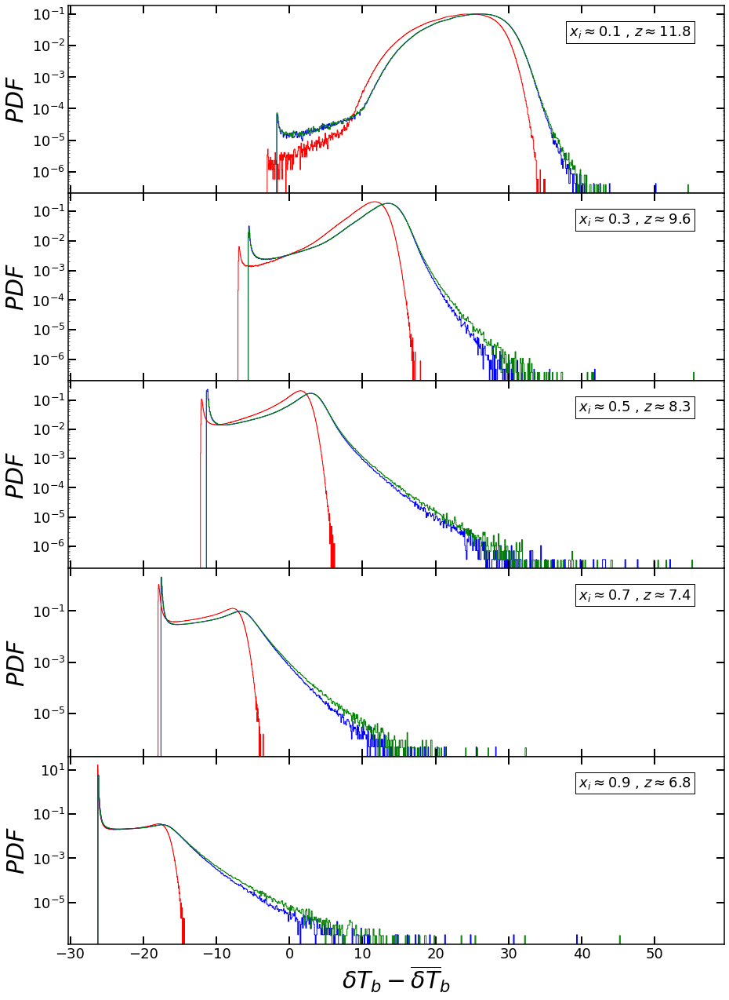

<Figure size 432x288 with 0 Axes>

In [46]:
from clump_functions import getSmartBin

os.chdir(work_path)
plt.rcParams['font.size'] = 18
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True

fig, ax = plt.subplots(5, figsize=(15, 22), sharex=True)

for fit in models.index:
    _, mean_dTb = np.loadtxt(fit+'/21cm/dTb_data_'+fit+'.txt', usecols=(0, 3), unpack=True)    
    redshift = models.loc[fit, 'redshift_dT_to_xHII'][::-1]
    xHII = models.loc[fit, 'xHII'][::-1]

    redshift_sample = np.mean(models['redshift_dT_to_xHII'], axis=0)[::-1]
    xHII_sample = np.mean(models['xHII'], axis=0)[::-1]
        
    print 'z =',redshift 
    for i in range(len(redshift)):
        dTb = read_cbin('%s/21cm/dTb_data/dTb_cbin_z%.3f.dat' %(fit, redshift[i]))
        n, bins, _ = ax[i].hist((dTb - mean_dTb[idx[i]]).flatten(), bins=600, density=True, stacked=True, histtype='step', color=models.loc[fit,'color'])
        ax[i].text(0.95, 0.90, r"$x_i \approx %.1f$ , $z \approx %.1f$" %(xHII_sample[i], redshift_sample[i]), bbox={'facecolor':'white', 'alpha':1.}, horizontalalignment='right', verticalalignment='top', transform=ax[i].transAxes)
        ax[i].set_ylabel("$PDF$", size=labels_size), ax[i].set_yscale('log')
        ax[i].tick_params(axis='both', length=10, width=2)
        print 'normalization z=%.3f:\t%.3f' %(redshift[i], np.trapz(n, 0.5*(bins[:-1]+bins[1:])))
        print '\txi_min=%.3f\txi_max=%.3f' %(np.min(xi), np.max(xi))
    print 'done %s\n' %fit
plt.xlabel(r"$\delta T_b - \overline{\delta T}_b$", size=labels_size)
#plt.legend(loc=1, borderpad=0.5, prop={'size':10})
fig.subplots_adjust(hspace = 0.)
fig.savefig('plotPDF_21cm.png', bbox_inches='tight')     # save Plot
plt.show()
plt.clf()


## Correlation Matrix

In [15]:
from tools21cm.conv import *
from tools21cm.const import *

import astropy.units as u
from astropy import constants as cst
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=H0, Om0=Omega0, Ob0=OmegaB)

set_sim_constants(500)  # Set 500 Mpc/h BoxSize

models = ModelsParameters()

alphB = (2.59e-13*u.cm**3/u.s).cgs
mp = cst.m_p.cgs
V_RTcell = ((500./(0.7*300.**3))*u.Mpc**3).cgs
rho_b = cosmo.critical_density0.cgs * cosmo.Ob0
eta_He = 0.074
mu_H = 1.+4*eta_He/(1-eta_He)

For mean ionized fraction (volume):	xHII = [0.7 0.5 0.3]


100%|██████████| 53/53 [10:02<00:00, 10.46s/it]


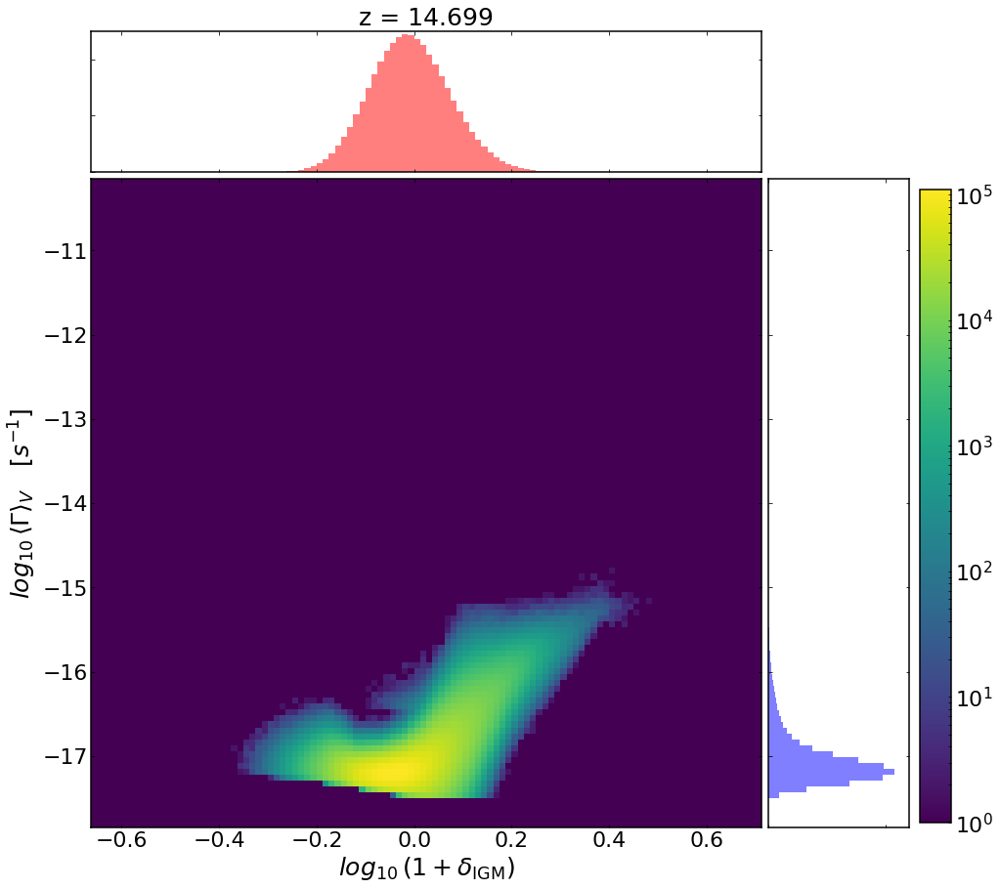

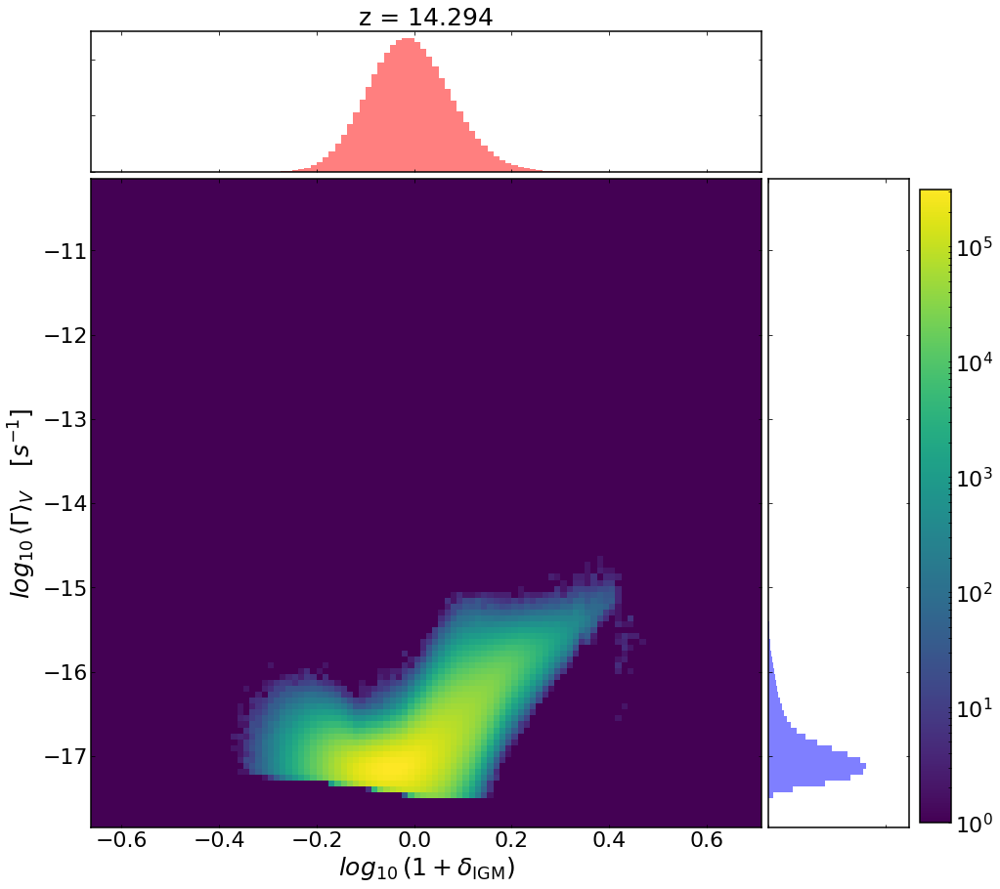

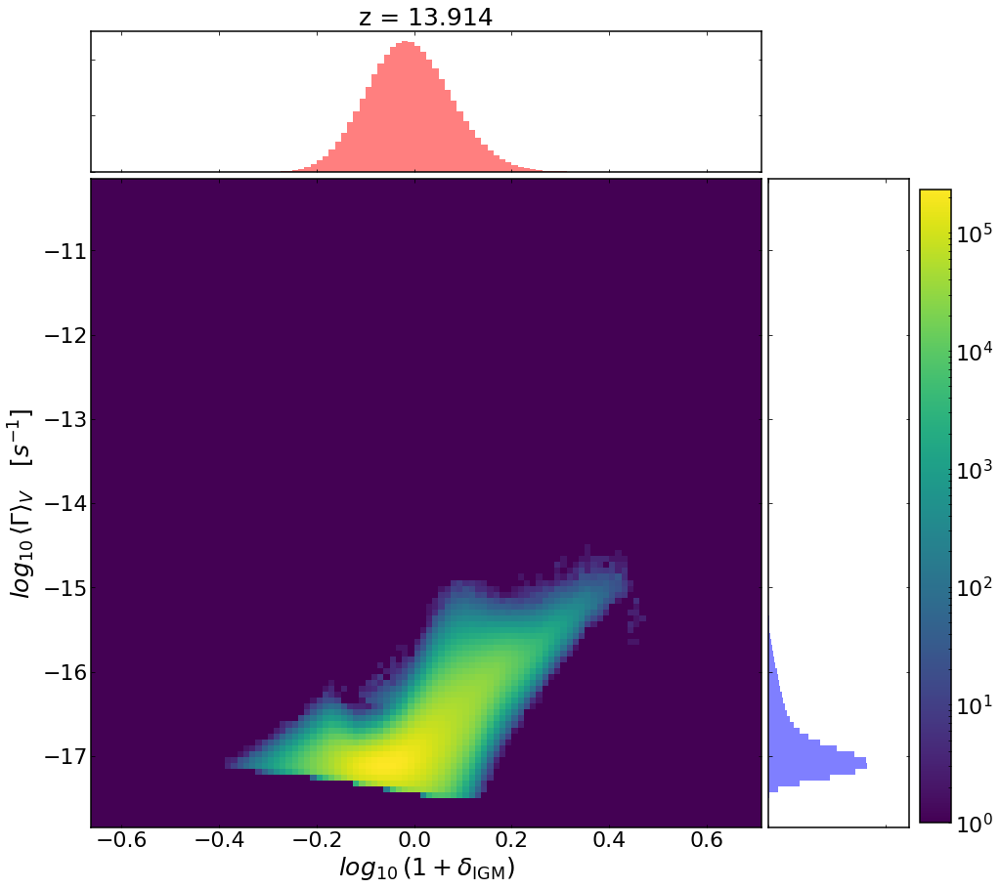

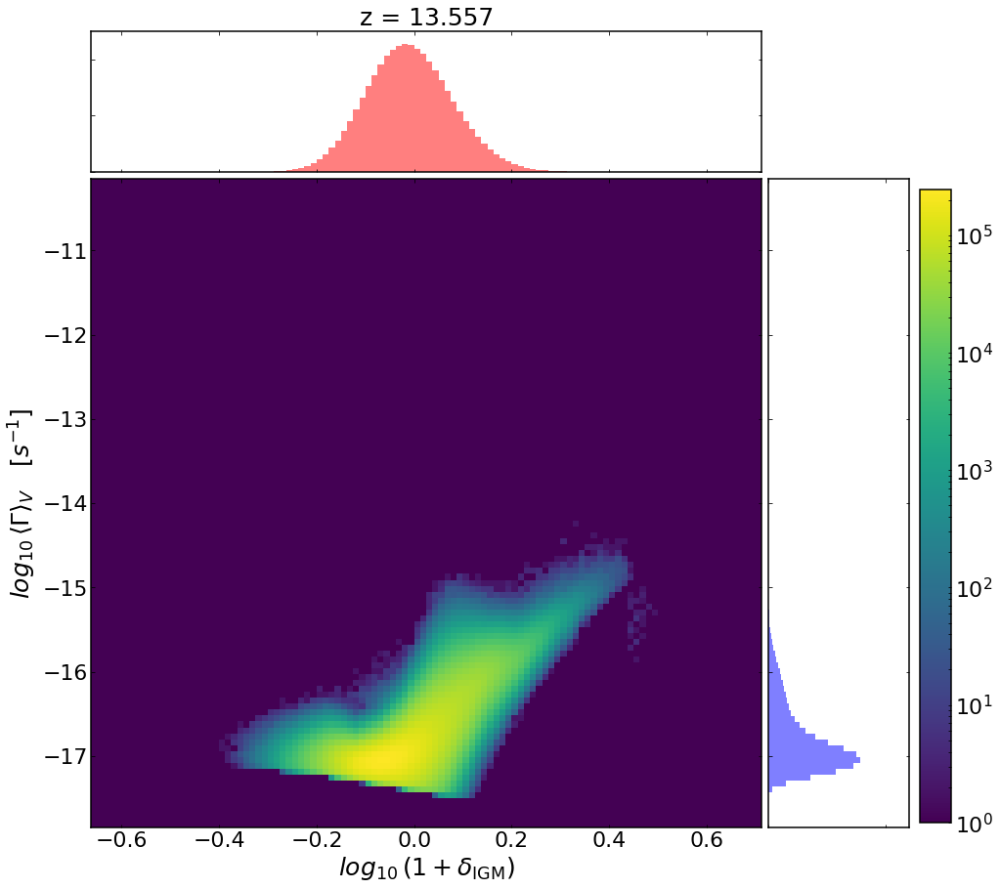

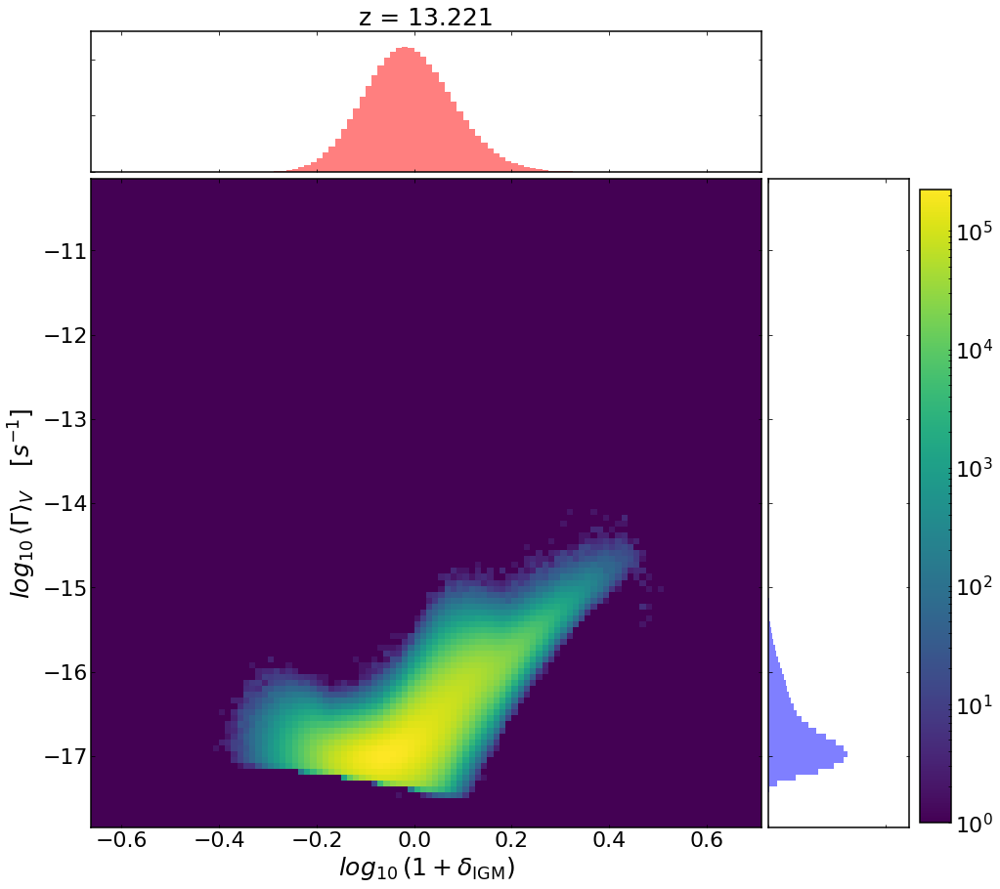

...

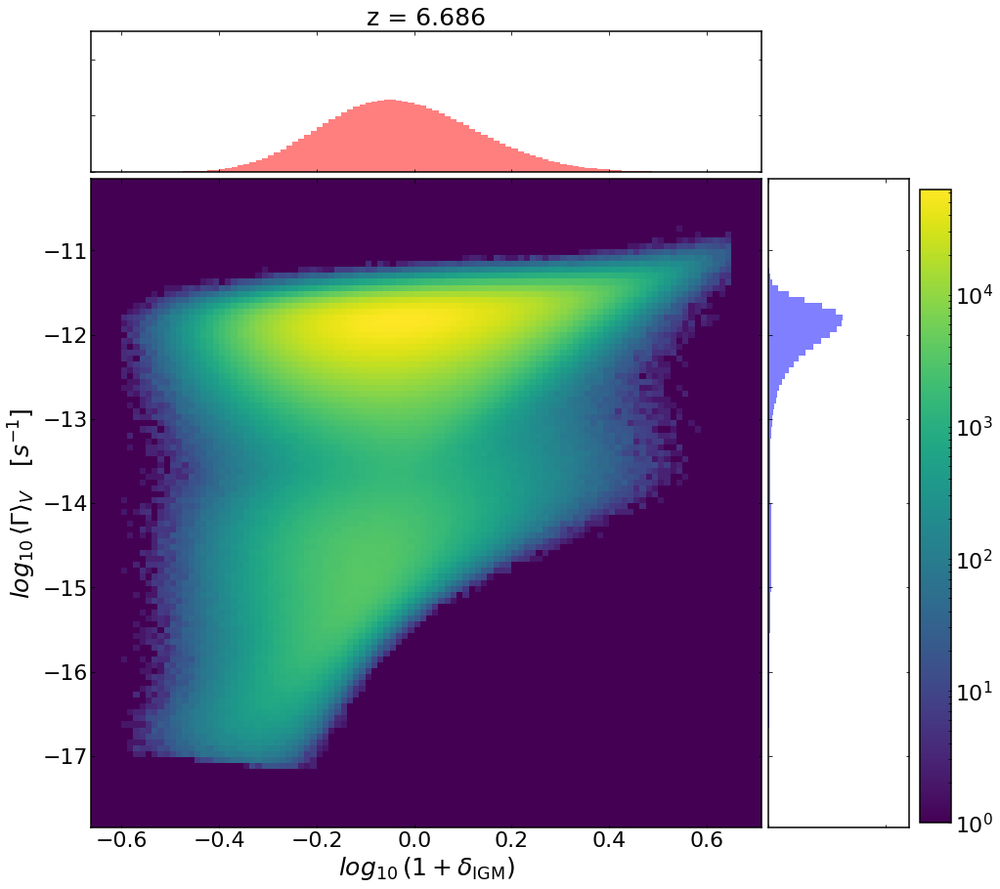

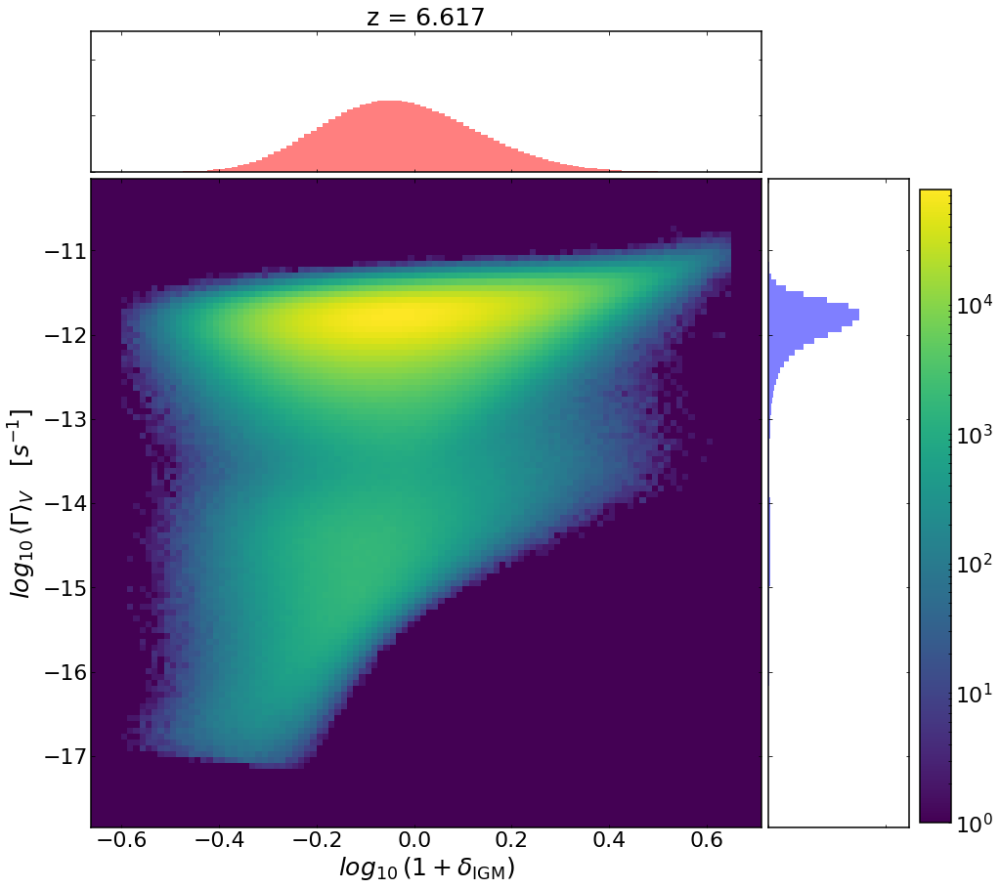

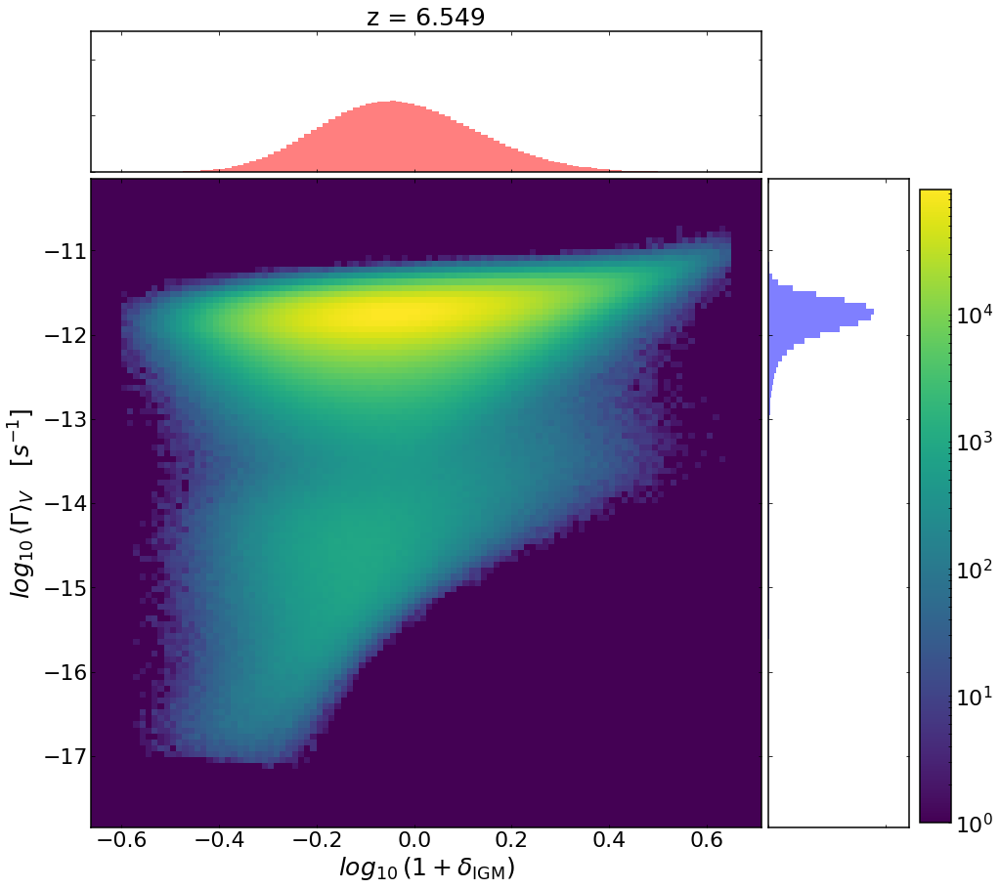

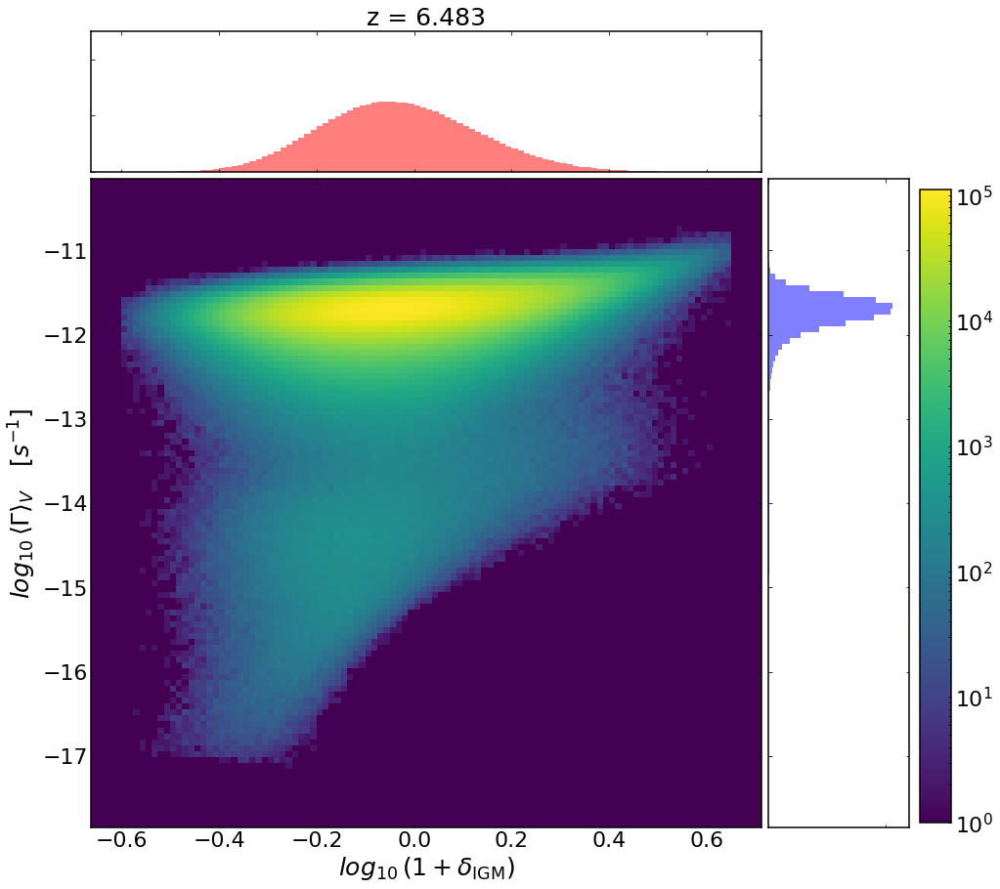

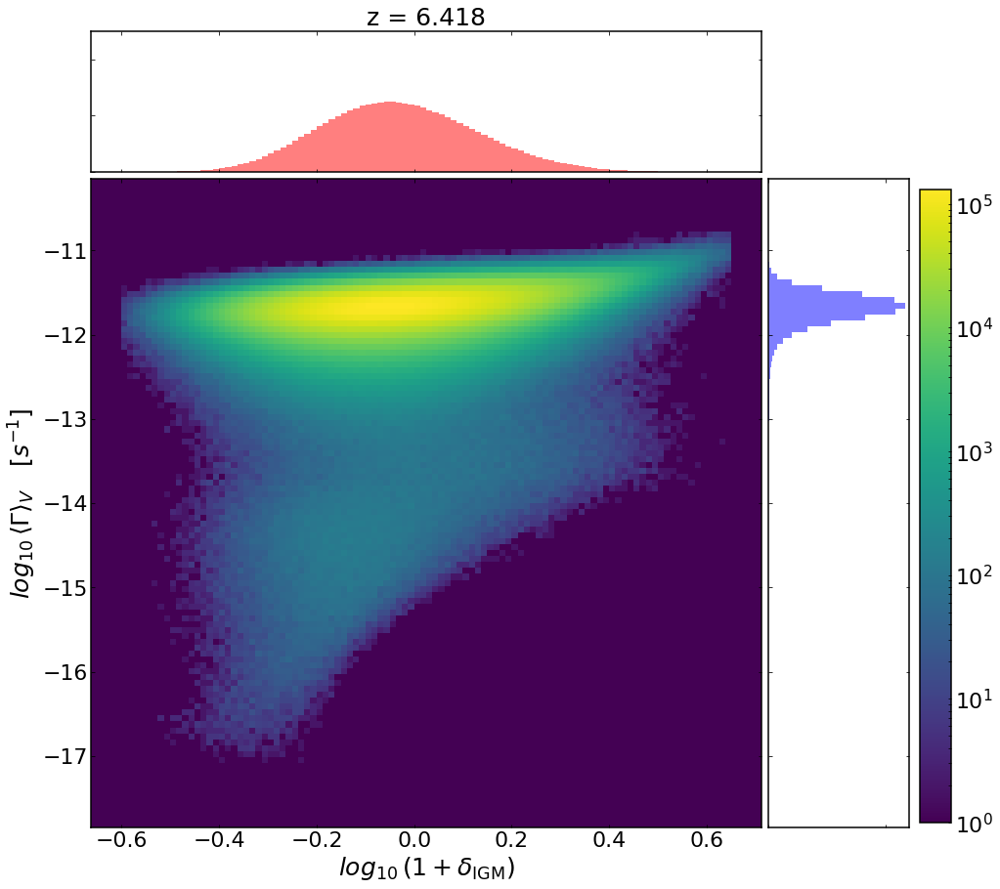

In [21]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
plt.rcParams['font.size'] = 22
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True
plt.rcParams['axes.linewidth'] = 1.5

output_path = '/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/'

for fit in models.index:
    path_result = '/research/prace3/reion/500Mpc_RT/500Mpc_f5_8.2pS_300_stochastic_C%s/results/' %fit
    path_clump = '/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/' 
    
    os.system('mkdir %s/hist2D' %(output_path+fit))
    
    redshift_c = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/z_500Mpc_nc300.txt')
    redshift_x = get_xfrac_redshifts(path_result)

    redshift = SameValuesInArray(redshift_c, redshift_x)[10:]
    np.savetxt('%s/hist2D/redshift.txt' %(output_path+fit), redshift, fmt='%.3f')
    
    for i in tqdm(range(len(redshift))):
        z = redshift[i]
        logd = read_cbin('%sdensity_data/logdens_z%.3f.dat' %(path_clump, z)).flatten()
        #C = np.power(10, read_cbin(path_clump+fit+'/z%.3f_res1.667_%s.dat' %(z, fit))).flatten()
        phrate = np.log10(IonRateFile(path_result+'IonRates3_%.3f.bin' %z).irate.flatten())
        
        """
        par = np.loadtxt('/its/home/mb756/SubGrid_test/outputs/output_simclump/SimClumpMic_180614_500Mpc_nc300-MQL/%s/res1.667_mean.txt' %fit, usecols=(0,1,2))
        C = SubgridClumping(z, *par)
        print min(phrate), max(phrate)
        print min(C), max(C)

        """
        
        #maximum_x = 250 if max(C) > 250 else max(C)
        #minimum_y = -17.75 if min(phrate) == -np.inf else min(phrate)
        #x_edges = np.linspace(0, np.mean(C)**(1.75), 101)
        x_edges = np.linspace(-0.6, 0.65, 101)
        y_edges = np.linspace(-20.5, -10.5, 101)

        fig, ax = plt.subplots(figsize=(15, 15))
        cbaxes = fig.add_axes([0.91, 0.13, 0.03, 0.6]) 
        fig.colorbar(im, cax=cbaxes)
        
        # 2D histogram
        ax.set_ylabel(r'$log_{10}\,\left< \Gamma \right>_V$   $[s^{-1}]$', size=25)
        #ax.set_xlabel(r'$\mathcal{C}_{cell}$', size=25)
        ax.set_xlabel(r'$log_{10}\, \left( 1+\delta_{\rm IGM}\right)$', size=25)
        ax.set_facecolor("#440154FF")
        n, xbin, ybin, im = ax.hist2d(logd, phrate, bins=(x_edges, y_edges) , norm=LogNorm(), cmap='viridis');
        
        # x-variable histogram (top)
        divider = make_axes_locatable(ax)
        axHistx = divider.append_axes("top", 2., pad=0.1, sharex=ax)
        axHistx.set_title("z = %.3f" %z, size=25)
        axHistx.hist(logd, bins=x_edges, color='red', alpha=0.5, density=True);
        axHistx.set_ylim(0, 5)
        
        # y-variable histogram (right)
        axHisty = divider.append_axes("right", 2., pad=0.1, sharey=ax)
        axHisty.set_xlim(0, 2.4)
        axHisty.hist(phrate, bins=y_edges, color='blue', alpha=0.5, orientation='horizontal', density=True);

        plt.setp(axHistx.get_xticklabels() + axHisty.get_yticklabels(), visible=False)
        plt.setp(axHistx.get_yticklabels() + axHisty.get_xticklabels(), visible=False)

        fig.savefig('%s/%.3f_Phot+overd_hist.png' %(output_path+fit+'/hist2D', z), bbox_inches='tight')     # save Plot
        #plt.show()
        #plt.clf()
        #break
    #break

In [22]:
for fit in models.index:
    output_path = '/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/'
    os.chdir('%s/hist2D' %(output_path+fit))
    redshift = np.loadtxt('redshift.txt')
    arr = ['%.3f_Phot+overd_hist.png' %z for z in redshift]
    CreateGif('%smovie_2DHist_irate+overd_%s' %(output_path, fit), arr, fps=10, fmt='avi')

[MoviePy] >>>> Building video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_mean.avi
[MoviePy] Writing video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_mean.avi


100%|██████████| 52/52 [00:04<00:00, 11.41it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_mean.avi 



4.0M	/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_mean.avi

[MoviePy] >>>> Building video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_quadfit.avi
[MoviePy] Writing video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_quadfit.avi


100%|██████████| 51/51 [00:04<00:00, 11.43it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_quadfit.avi 



4.0M	/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_quadfit.avi

[MoviePy] >>>> Building video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_scat.avi
[MoviePy] Writing video /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_scat.avi


100%|██████████| 53/53 [00:04<00:00, 11.36it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_scat.avi 



4.0M	/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/movie_2DHist_irate+overd_scat.avi



In [17]:
output_path = '/its/home/mb756/SubGrid_test/outputs/output_result/Result_500Mpc_f5_8.2pS_300_stochastic_CAll/'

redshift = np.loadtxt(output_path+'quadfit/hist2D/redshift.txt')
for z in redshift:
    arr = [output_path+'mean/hist2D/%.3f_Phot+overd_hist.png' %z, output_path+'quadfit/hist2D/%.3f_Phot+overd_hist.png' %z, output_path+'scat/hist2D/%.3f_Phot+overd_hist.png' %z]
    MergeImages('plot_compare_hist2D_phot+overd_%.3f' %z, arr, output_path=output_path+'merged_images/', form='h')
    

## Correlation between models of $x_i$

In [22]:
models = ModelsParameters([0.1, 0.3, 0.5, 0.7, 0.9, 0.99])

For mean ionized fraction (volume):	xHII = [0.1  0.3  0.5  0.7  0.9  0.99] 



In [23]:
models

,name,color,style,lw,redshift_to_xHII,redshift_dT_to_xHII,xHII,xHI
mean,GCM,r,-,2,"[11.918, 9.533, 8.118, 7.221, 6.721, 6.483]","[11.791, 9.457, 8.064, 7.221, 6.686, 6.483]","[0.1018, 0.3016, 0.4999, 0.6994, 0.8974, 0.9912]","[0.898, 0.698, 0.5, 0.301, 0.103, 0.009]"
quadfit,DCM,b,--,3.5,"[11.918, 9.611, 8.34, 7.48, 6.905, 6.583]","[11.791, 9.611, 8.283, 7.48, 6.905, 6.549]","[0.1024, 0.3037, 0.4961, 0.7026, 0.898, 0.9888]","[0.898, 0.696, 0.504, 0.297, 0.102, 0.011]"
scat,SCM,g,-,2,"[11.918, 9.611, 8.34, 7.48, 6.905, 6.549]","[11.791, 9.611, 8.283, 7.48, 6.905, 6.549]","[0.1025, 0.3039, 0.4962, 0.7031, 0.8983, 0.9917]","[0.897, 0.696, 0.504, 0.297, 0.102, 0.008]"


In [27]:
for fit in models.index:
    redshift = models.loc[fit, 'redshift_to_xHII']
    print redshift
    #for z in redshift:
        

[11.918  9.533  8.118  7.221  6.721  6.483]
[11.918  9.611  8.34   7.48   6.905  6.583]
[11.918  9.611  8.34   7.48   6.905  6.549]


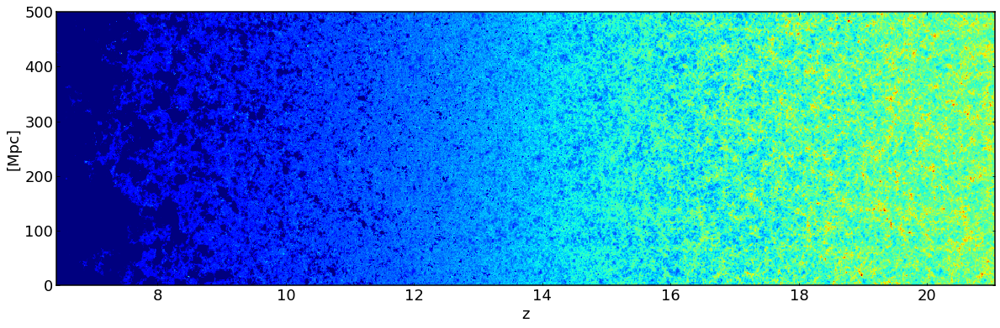

In [56]:
plt.figure(figsize=(20,6))
lightcone_scat = read_cbin('scat/lightcone/dataLightcone_dTb_Cscat.dat')
z_scat = np.fromfile('scat/lightcone/Zlightcone_dTb_Cscat.dat', dtype=np.float64)
im = plt.imshow(lightcone_scat[:,150,:], cmap='jet', extent=[z_scat.min(),z_scat.max(),0,500], aspect='auto')

plt.xlabel('z'), plt.ylabel('[Mpc]')
plt.savefig('21cmLC.png')

13.293644541564293


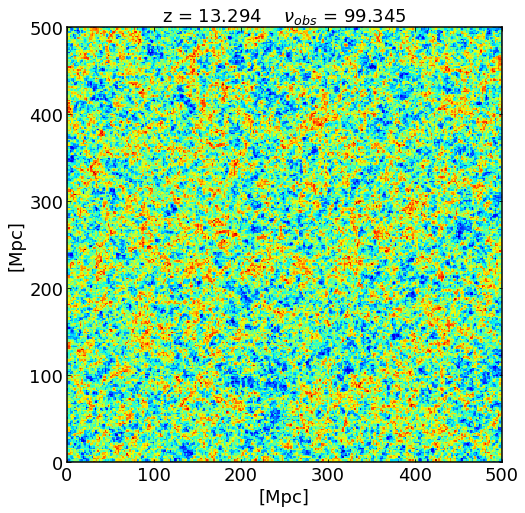

In [59]:
i = 710
z = z_scat[i]
plt.rcParams['font.size'] = 18

print(z)
plt.figure(figsize=(18,8))
plt.title(r'z = %.3f    $\nu_{obs}$ = %.3f' %(z, 1420./(1+z)), size=18)
plt.imshow(lightcone_scat[:,:,i], cmap='jet', origin='lower', extent=[0,500,0,500])
plt.xlabel('[Mpc]', size=18), plt.ylabel('[Mpc]', size=18)
plt.savefig('21cmtest.png')

In [26]:
lightcone_scat.shape

(300, 300, 1068)